# Single-cell & Spatial RNA-seq analysis

By Yiming 2023 Feb 27

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
sc.settings.verbosity = 3             
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/home/yiming/.conda/envs/scanpy/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.8.1 pandas==1.4.3 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


# Load sc data

In [4]:
adata = sc.read('/home/yiming/vio_analysis/revision/res17_adata_anno_2.h5ad')

In [ ]:
# reorder cell type order in umap
adata.obs['celltype'].cat.reorder_categories(sorted(adata.obs['celltype'].unique()), inplace=True)

In [4]:
# adjust color
def get_colors_by_cells(cell_list):
    return [cmap_dict[cell] for cell in cell_list]

cell_type = list(['Ery', 'MEP', 'Ect-like', 'Fibro', 'PSC-Ect', 'Mes-like', 'PSC-like', 'TB-like', 'CM-like', 
                  'Mono', 'YSE', 'Endo', 'Mk', 'NC', 'NE-like', 'MP-1', 'HPC', 'MP-2'])
my_colors = list(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf',
                  '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5'])
cmap_dict = dict(zip(cell_type, my_colors))

In [6]:
adata.uns['celltype_colors'] = get_colors_by_cells(adata.obs['celltype'].cat.categories)

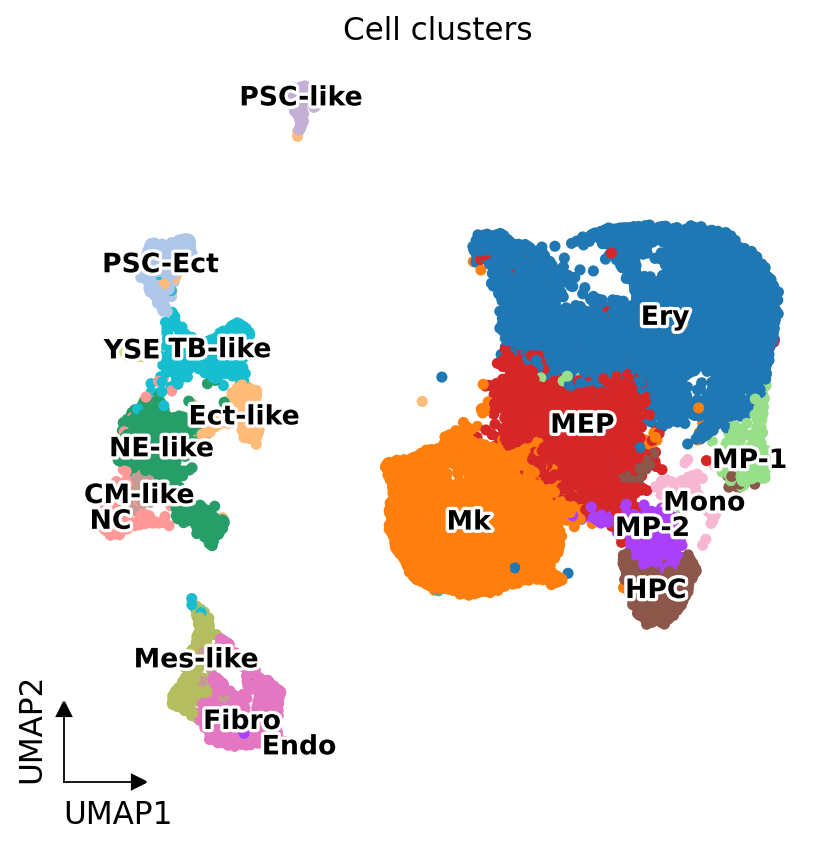

In [9]:
fig, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(adata, color=['celltype'], legend_loc="on data", legend_fontsize=12, size=100, ax=ax, show=False, 
           legend_fontoutline=3, title = 'Cell clusters')

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

## frequency

In [15]:
cell_prop = adata.obs[['celltype', 'sample']]
cell_prop

,celltype,sample
VIO_D08_AAACCCACAGGTGACA-1,Ery,D08
VIO_D08_AAACCCAGTCTTTCAT-1,MEP,D08
VIO_D08_AAACCCAGTGGTCTGC-1,Ect-like,D08
VIO_D08_AAACCCATCCCATACC-1,Fibro,D08
VIO_D08_AAACGAACATACCAGT-1,Fibro,D08
...,...,...
VIO_D18_TTTGTTGTCACTGGTA-1,Mk,D18
VIO_D18_TTTGTTGTCGGCTTGG-1,Mk,D18
VIO_D18_TTTGTTGTCTCATAGG-1,Ery,D18
VIO_D18_TTTGTTGTCTCTAGGA-1,Ery,D18


In [16]:
cell_prop['count'] = np.ones((cell_prop.shape[0],))
cell_prop_matrix = pd.pivot_table(cell_prop, values='count', index='sample', columns='celltype', aggfunc='sum')
# pd.DataFrame.to_csv(cell_prop_matrix, 'cell_prop_matrix.csv')
cell_prop_matrix

/tmp/ipykernel_205296/3774721064.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_prop['count'] = np.ones((cell_prop.shape[0],))


celltype,Ery,Mk,NE-like,MEP,MP-2,HPC,Fibro,Mes-like,TB-like,PSC-Ect,Ect-like,MP-1,NC,PSC-like,CM-like,Mono,YSE,Endo
sample,,,,,,,,,,,,,,,,,,
D08,596.0,13.0,7.0,102.0,0.0,0.0,861.0,413.0,64.0,514.0,163.0,3.0,5.0,239.0,10.0,13.0,83.0,38.0
D15,2673.0,948.0,1697.0,1135.0,272.0,199.0,8.0,30.0,583.0,30.0,172.0,125.0,291.0,1.0,124.0,55.0,6.0,1.0
D18,4504.0,3185.0,8.0,1462.0,683.0,526.0,7.0,5.0,47.0,40.0,16.0,190.0,5.0,2.0,2.0,43.0,3.0,2.0


In [18]:
cellprop_perc = cell_prop_matrix.divide(cell_prop_matrix.sum(axis=1), axis=0)
cellprop_perc

celltype,Ery,Mk,NE-like,MEP,MP-2,HPC,Fibro,Mes-like,TB-like,PSC-Ect,Ect-like,MP-1,NC,PSC-like,CM-like,Mono,YSE,Endo
sample,,,,,,,,,,,,,,,,,,
D08,0.190781,0.004161,0.002241,0.032650,0.000000,0.000000,0.275608,0.132202,0.020487,0.164533,0.052177,0.000960,0.001601,0.076504,0.003201,0.004161,0.026569,0.012164
D15,0.320120,0.113533,0.203234,0.135928,0.032575,0.023832,0.000958,0.003593,0.069820,0.003593,0.020599,0.014970,0.034850,0.000120,0.014850,0.006587,0.000719,0.000120
D18,0.419758,0.296831,0.000746,0.136253,0.063653,0.049021,0.000652,0.000466,0.004380,0.003728,0.001491,0.017707,0.000466,0.000186,0.000186,0.004007,0.000280,0.000186


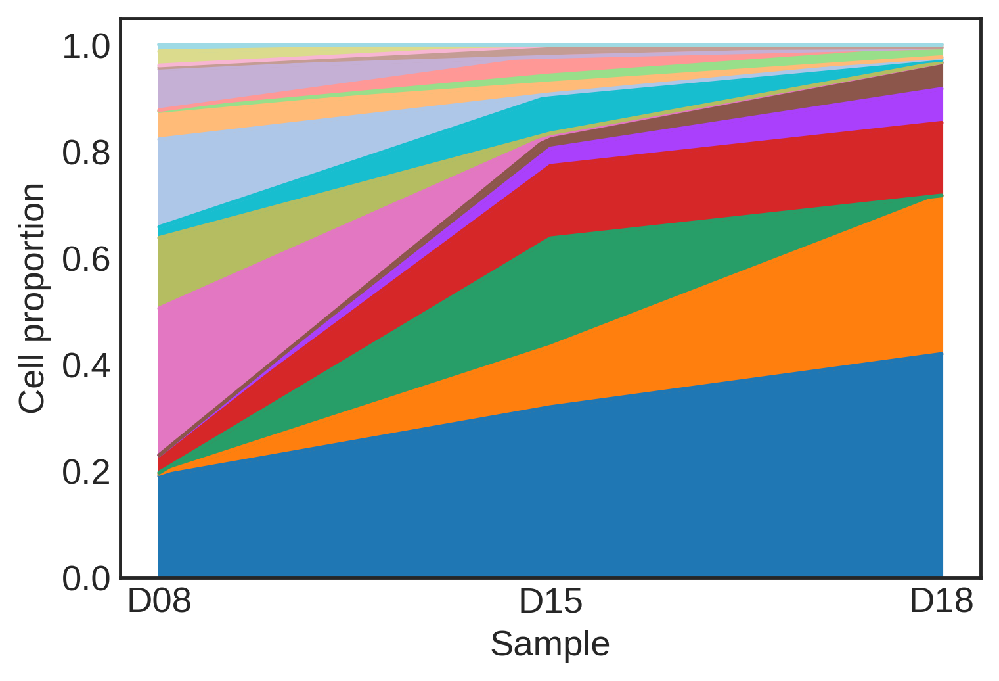

In [21]:
plt.style.use('seaborn-white')
plt.rcParams["figure.figsize"] = (6, 4)
plt.rcParams["figure.dpi"] = 140
cellprop_perc.plot.area(stacked=True, legend=False, color=my_colors)
plt.xlabel('Sample')
plt.ylabel('Cell proportion')
plt.show()

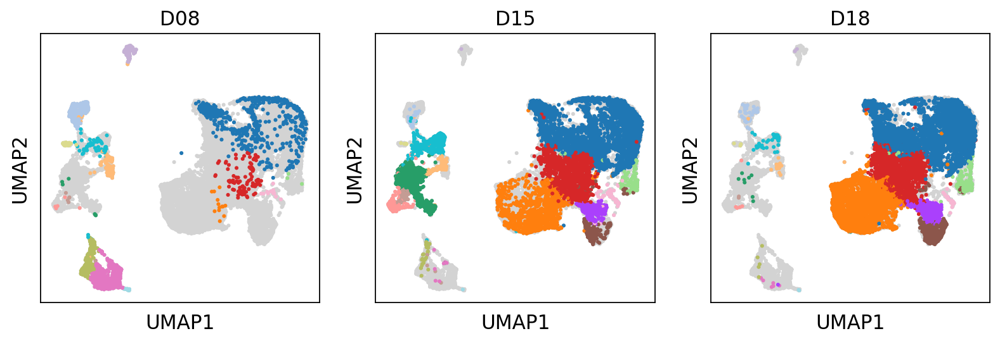

In [8]:
fig,axs = plt.subplots(1, 3, figsize=(12, 3.5), gridspec_kw={'hspace':0.5,})
axs = axs.flatten()
for i,sample in enumerate(['D08', 'D15', 'D18']):
    sc.pl.umap(adata, size=30, show=False, ax=axs[i], return_fig=fig)
    sc.pl.umap(adata[adata.obs['sample'] == sample], color='celltype', 
           legend_loc="None", 
            legend_fontsize=9, legend_fontoutline=2, size=30, show=False, return_fig=fig, ax=axs[i])
    axs[i].set_title(sample)

## non-hema clusters

In [4]:
# non-hema cells
adata_subset = adata[adata.obs['celltype'].isin(['Ect-like', 'Fibro', 'PSC-Ect', 'Mes-like', 
                                                 'PSC-like', 'TB-like', 'CM-like', 'YSE', 'Endo', 'NC', 'NE-like'])]

In [5]:
adata_subset

View of AnnData object with n_obs × n_vars = 5477 × 27059
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'DF.classifications', 'seurat_clusters', 'RNA_snn_res.1.7', 'sample', 'celltype'
    var: 'features'
    uns: 'neighbors'
    obsm: 'X_mnn', 'X_tsne', 'X_umap'
    varm: 'MNN'
    obsp: 'distances'

In [5]:
sc.pp.pca(adata_subset)
sc.pp.neighbors(adata_subset)
sc.tl.umap(adata_subset)
sc.tl.leiden(adata_subset, key_added="leiden")

computing PCA
    with n_comps=50
    finished (0:01:00)
computing neighbors


/home/yiming/.conda/envs/scanpy/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata.obsm['X_pca'] = X_pca


    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


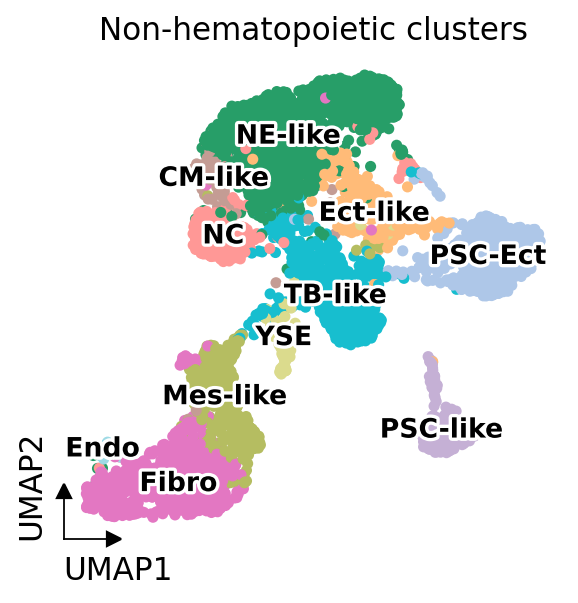

In [21]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.umap(adata_subset, color=['celltype'], legend_loc="on data", legend_fontsize=12, size=100, ax=ax, show=False, 
           legend_fontoutline=3, title = 'Non-hematopoietic clusters')

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

In [18]:
adata_subset.obs['label'] = adata_subset.obs['celltype']
adata_subset.obs['label'] = adata_subset.obs['label'].replace(['Ect-like', 'Fibro', 'PSC-Ect', 'Mes-like', 'PSC-like', 
                                                               'TB-like', 'CM-like', 'YSE', 'Endo', 'NC', 'NE-like'], 
                                                       ['Ectoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'PSC-like', 
                                                        'TB-like', 'Mesoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Ectoderm'])

In [19]:
adata_subset.uns['label_colors'] = ['#F4D58D', '#62ACE0', '#FA9F9A', '#E56B6F', '#BE95C4']

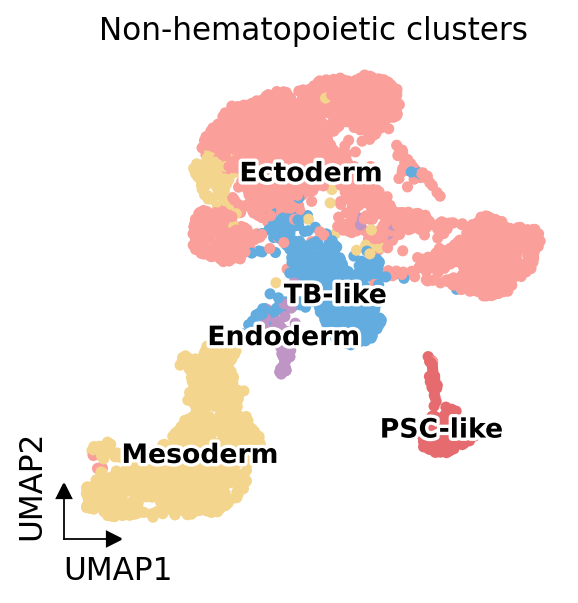

In [57]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.umap(adata_subset, color=['label'], legend_loc="on data", legend_fontsize=12, size=100, ax=ax, show=False, 
           legend_fontoutline=3, title = 'Non-hematopoietic clusters')

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

In [58]:
marker_genes_dict = {
    'PSC-like': ['NANOG', 'SOX17', 'KLF4', 'POU5F1'],
    'TB-like': ['CDH1', 'TFAP2A', 'EPCAM', 'ENPEP'], 
    'Ectoderm': ['SOX3', 'PAX6', 'OTX2', 'NES'],
    'Mesoderm': ['PDGFRA', 'KDR', 'BMP4', 'NCAM1'],
    'Endoderm': ['FOXA2', 'AFP', 'APOA1', 'GATA4']
}

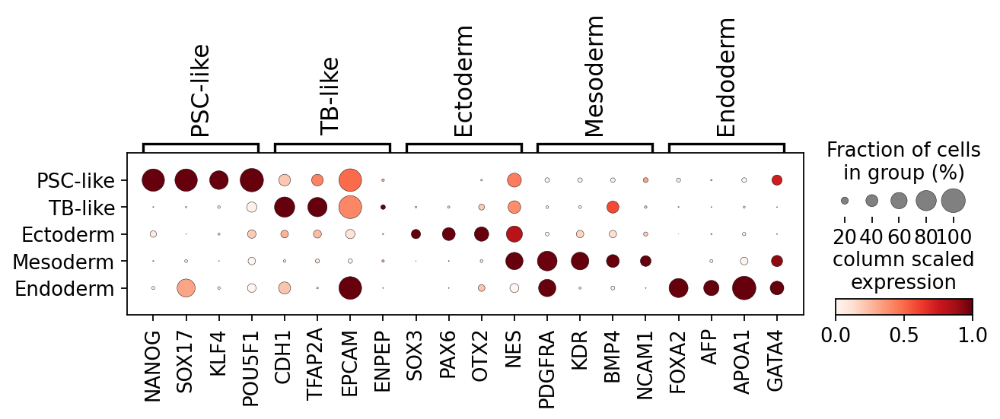

In [61]:
sc.pl.dotplot(adata_subset, marker_genes_dict, 'label', dendrogram=False, 
              standard_scale='var', colorbar_title='column scaled\nexpression', 
             categories_order=['PSC-like', 'TB-like', 'Ectoderm', 'Mesoderm', 'Endoderm'])

In [8]:
adata_subset_d15 = adata_subset[adata_subset.obs['sample'].isin(['D15'])]

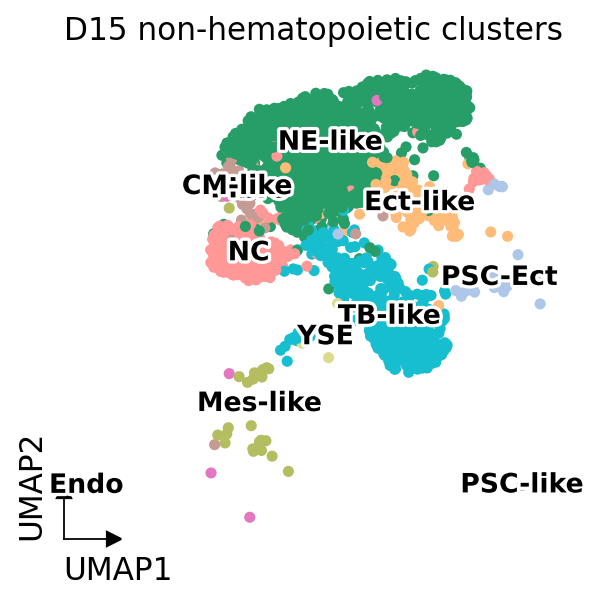

In [11]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.umap(adata_subset_d15, color=['celltype'], legend_loc="on data", legend_fontsize=12, size=100, ax=ax, show=False, 
           legend_fontoutline=3, title = 'D15 non-hematopoietic clusters')

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

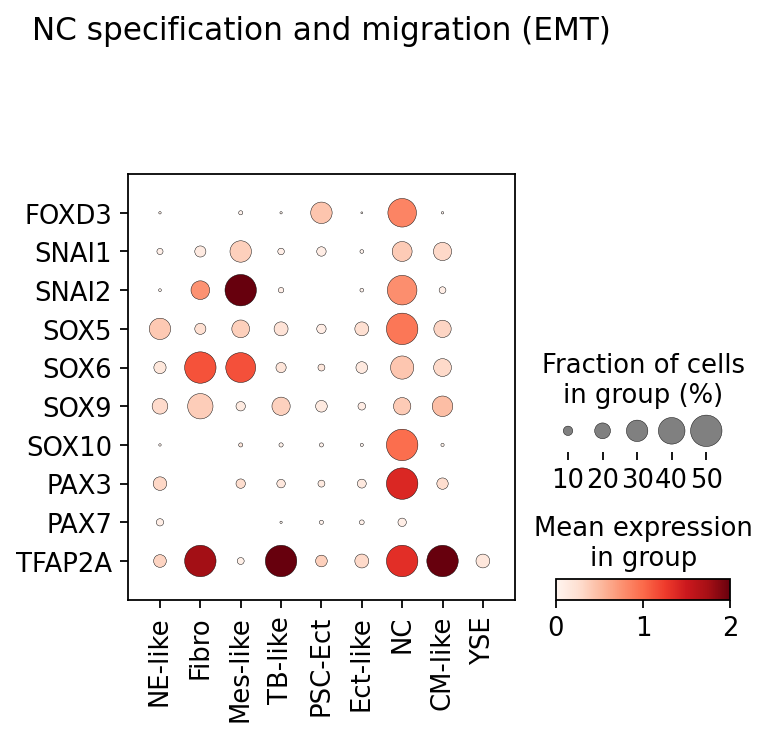

In [12]:
sc.pl.dotplot(adata_subset_d15, var_names=['FOXD3', 'SNAI1', 'SNAI2', 'SOX5', 'SOX6', 'SOX9', 'SOX10', 'PAX3', 'PAX7', 'TFAP2A'], 
           color_map='Reds', groupby=['celltype'],
           vmax=2, dot_max=0.5, cmap='Reds', 
           title='NC specification and migration (EMT)', 
           swap_axes = True
             )

In [13]:
plt.rcParams.update({'axes.titlesize' : 25}) 

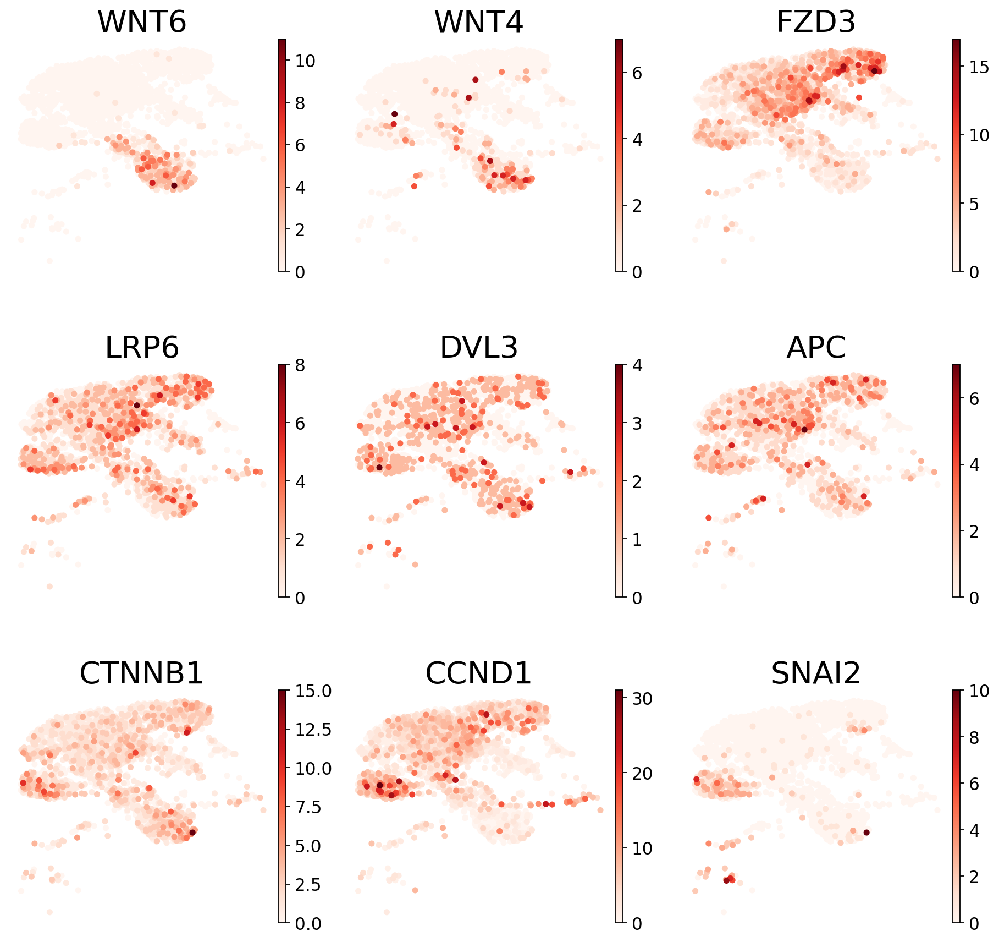

In [14]:
sc.pl.umap(adata_subset_d15, color=['WNT6', 'WNT4', 'FZD3', 'LRP6', 'DVL3', 'APC', 'CTNNB1',  'CCND1', 'SNAI2'], 
           color_map='Reds', size=100, ncols=3, hspace=0.4, wspace=0.15, frameon=False)

## pseudotime analysis

In [51]:
adata = adata_subset

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


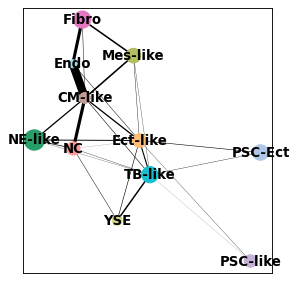

In [52]:
sc.tl.paga(adata, groups='celltype')
sc.pl.paga(adata, color=['celltype'])

In [53]:
sc.pp.neighbors(adata)
sc.tl.draw_graph(adata, init_pos='paga')

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:42)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:47)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:30)


In [73]:
# reorder cell type order in umap
adata_subset.obs['label'].cat.reorder_categories(sorted(adata_subset.obs['label'].unique()), inplace=True)

In [74]:
def get_colors_by_cells(cell_list):
    return [cmap_dict[cell] for cell in cell_list]

cell_type = list(['Ectoderm', 'Endoderm', 'Mesoderm', 'PSC-like', 'TB-like'])
my_colors = list(['#FA9F9A', '#BE95C4', '#F4D58D', '#E56B6F', '#62ACE0'])
cmap_dict = dict(zip(cell_type, my_colors))

In [75]:
adata_subset.uns['label_colors'] = get_colors_by_cells(adata_subset.obs['label'].cat.categories)

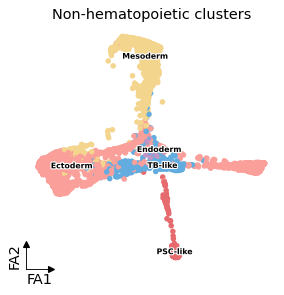

In [80]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.draw_graph(adata, color=['label'], legend_loc='on data', legend_fontsize=7, size=100, ax=ax, 
                 legend_fontoutline=2, show=False, title='Non-hematopoietic clusters',
#                  legend_fontoutline=2, show=False, title='Cell clusters',
                )

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

In [55]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['celltype']  == 'PSC-like')[0]

In [56]:
sc.tl.dpt(adata)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9971332  0.9967434  0.9939348  0.985827   0.98074156
     0.9778274  0.97451055 0.96833795 0.96731234 0.9661537  0.95897895
     0.95238274 0.94698656 0.9459384 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


In [57]:
adata_raw = adata.raw.to_adata()
sc.pp.log1p(adata_raw)
sc.pp.scale(adata_raw)
adata.raw = adata_raw

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


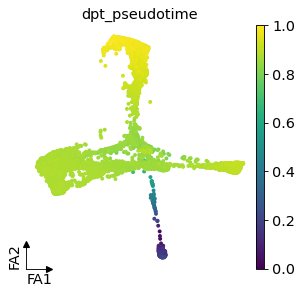

In [71]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.draw_graph(adata, color=['dpt_pseudotime'], size=50, ax=ax, 
                 show=False)

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

## rna velocity

In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scvelo as scv
scv.settings.verbosity = 0
import unitvelo as utv

(Running UniTVelo 0.2.4.1)
2023-02-22 09:37:32


2023-02-22 17:37:32.467372: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
sc.settings.verbosity = 3             
sc.logging.print_header()
scv.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.1 pynndescent==0.5.7


In [7]:
adata = sc.read('/home/yiming/vio_analysis/revision/res17_adata_anno_2.h5ad')

In [8]:
# mk on d15
adata = adata[adata.obs['celltype'].isin(['Mk', 'MEP', 'HPC'])]
adata = adata[adata.obs['sample'].isin(['D15'])]

In [11]:
# add splice counts from loom file
adata_loom = scv.read("/usersdata/yiming/VIO/cellranger_run/velocyto/merge.loom", cache=True)
adata = scv.utils.merge(adata, adata_loom)

... reading from cache file cache/usersdata-yiming-VIO-cellranger_run-velocyto-merge.h5ad


In [12]:
# create a new adata to include new embedding and splice counts
adata_emb_spl = sc.AnnData(adata.layers['spliced'])
adata_emb_spl.layers['spliced'] = adata.layers['spliced']
adata_emb_spl.layers['unspliced'] = adata.layers['unspliced']
adata_emb_spl.obs = adata.obs
adata_emb_spl.var = adata.var
adata_emb_spl.uns = adata.uns
adata_emb_spl.obsm = adata.obsm

In [14]:
adata_emb_spl.uns['celltype_colors'] = get_colors_by_cells(adata_emb_spl.obs['celltype'].unique().categories)

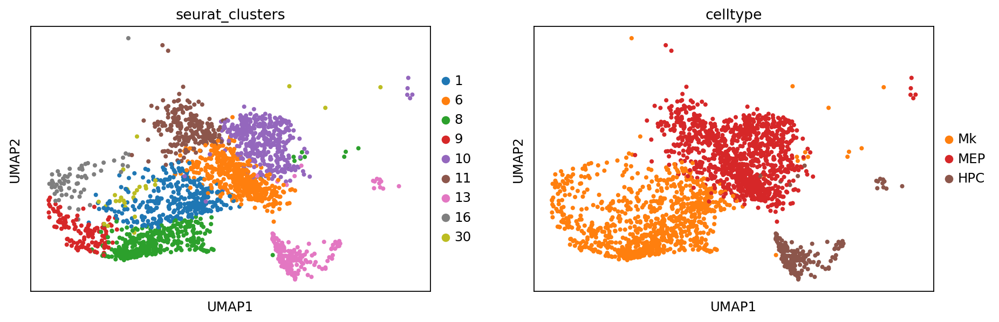

In [15]:
sc.pl.umap(adata_emb_spl, color=['seurat_clusters', 'celltype'])

In [16]:
velo_config = utv.config.Configuration()

In [17]:
velo_config.OFFSET_GENES = True
velo_config.R2_ADJUST = False
velo_config.IROOT = 'HPC'
velo_config.FIT_OPTION = '1'

-------> Manully Specified Parameter <-------
R2_ADJUST:	False
IROOT:	HPC


-------> Model Configuration Settings <------
N_TOP_GENES:	2000
LEARNING_RATE:	0.01
FIT_OPTION:	1
DENSITY:	SVD
REORDER_CELL:	Soft_Reorder
AGGREGATE_T:	True
GENE_PRIOR:	None
VGENES:	basic


Current working dir is /home/yiming/vio_analysis/revision
Results will be stored in res folder
computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:02)
---> # of velocity genes used 967
---> # of velocity genes used 967
---> # of velocity genes used 949


2023-02-22 05:28:47.050264: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-02-22 05:28:47.061748: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2023-02-22 05:28:47.061831: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (biomed1.sbms.hku.hk): /proc/driver/nvidia/version does not exist
2023-02-22 05:28:47.139164: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


---> Use Diffusion Pseudotime as initial.
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9864245  0.97618335 0.9479064  0.9376395  0.9247395
     0.91820556 0.91293335 0.8909569  0.8689015  0.8469982  0.82944685
     0.81586874 0.8137552  0.80292577]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:03)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


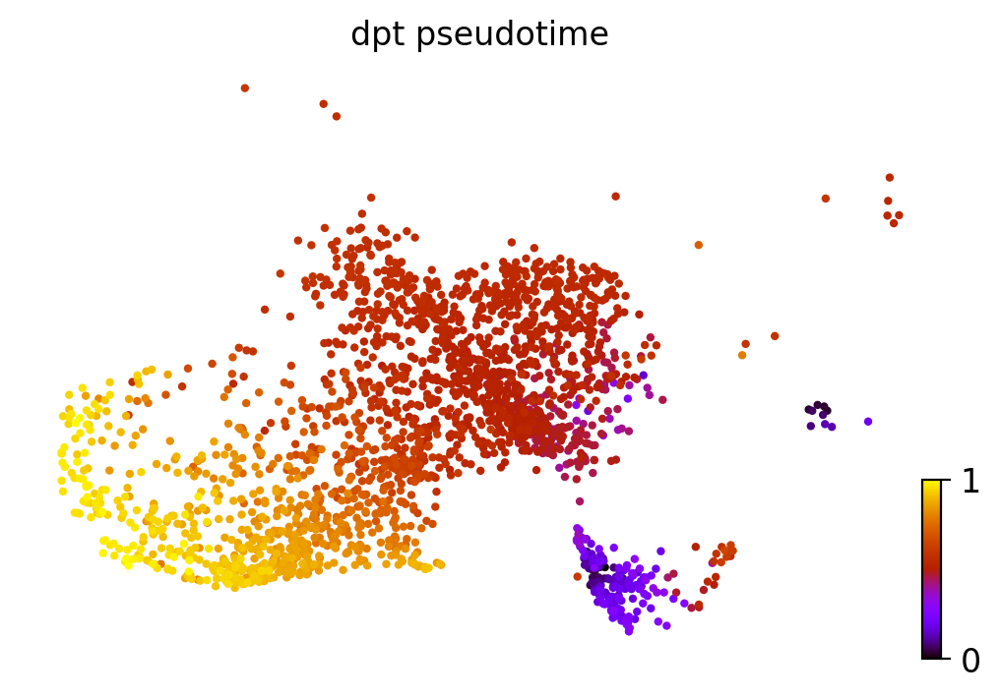

  0%|          | 0/12000 [00:00<?, ?it/s]

 | 79,739,216612

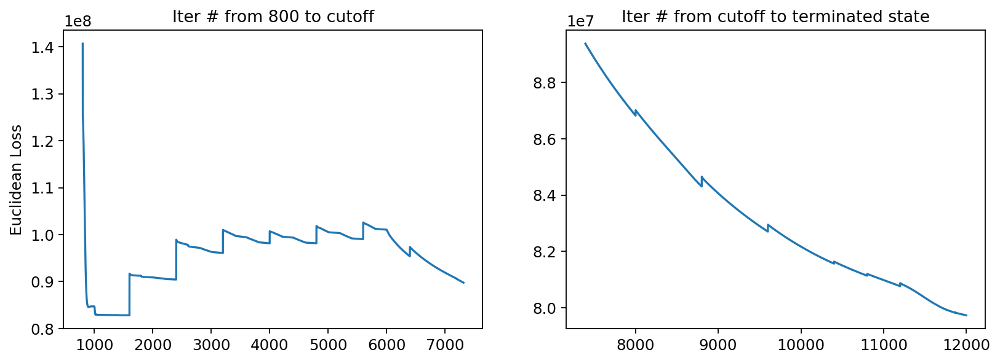

Total loss 79739216, vgene loss 79739216


  0%|          | 0/2282 [00:00<?, ?cells/s]

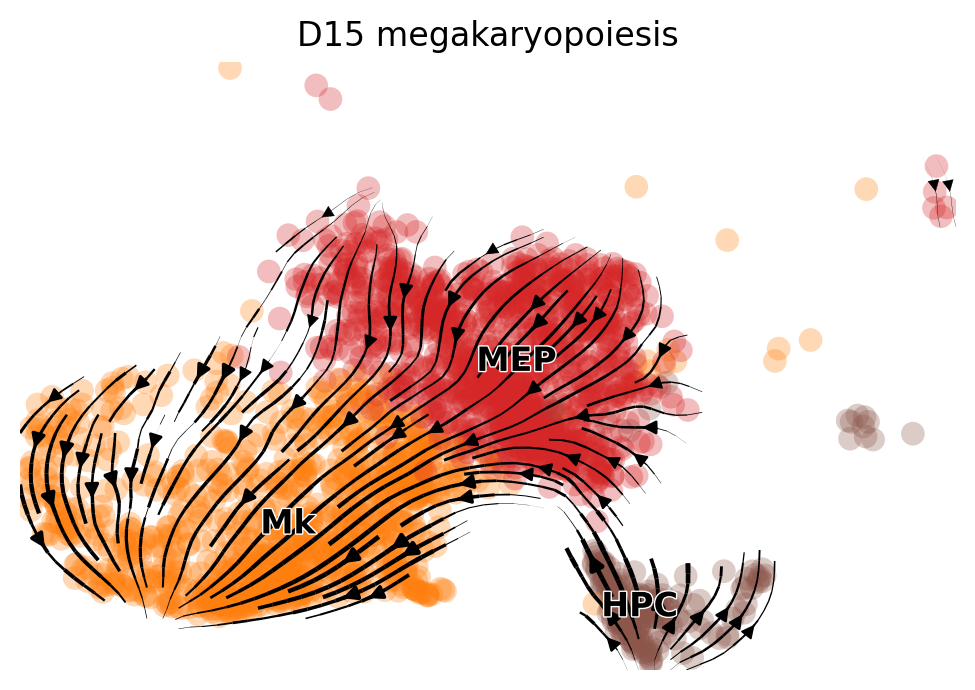

In [18]:
adata_emb_spl = utv.run_model(adata_emb_spl, 'celltype', config_file=velo_config)
scv.pl.velocity_embedding_stream(adata_emb_spl, color='celltype', dpi=100, title='D15 megakaryopoiesis')

In [32]:
# myeloid on d15
adata = adata[adata.obs['celltype'].isin(['HPC', 'MP-1', 'MP-2', 'Mono'])]
adata = adata[adata.obs['sample'].isin(['D15'])]

In [37]:
# create a new adata to include new embedding and splice counts
adata_emb_spl = sc.AnnData(adata.layers['spliced'])
adata_emb_spl.layers['spliced'] = adata.layers['spliced']
adata_emb_spl.layers['unspliced'] = adata.layers['unspliced']
adata_emb_spl.obs = adata.obs
adata_emb_spl.var = adata.var
adata_emb_spl.uns = adata.uns
adata_emb_spl.obsm = adata.obsm

In [39]:
adata_emb_spl.uns['celltype_colors'] = get_colors_by_cells(adata_emb_spl.obs['celltype'].unique().categories)

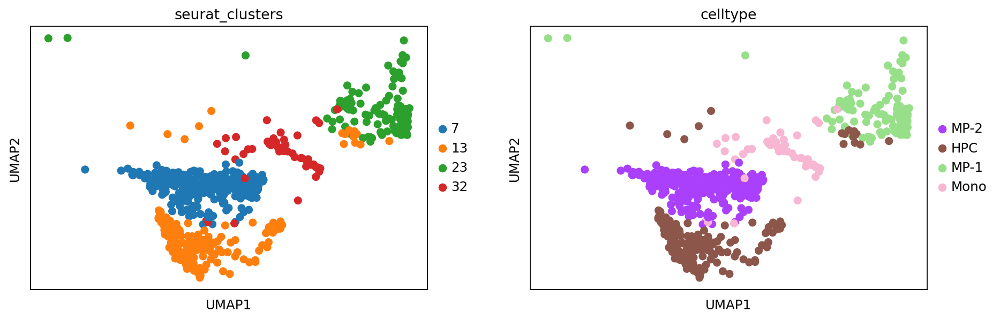

In [40]:
sc.pl.umap(adata_emb_spl, color=['seurat_clusters', 'celltype'])

In [41]:
velo_config = utv.config.Configuration()

In [42]:
velo_config.OFFSET_GENES = False
velo_config.R2_ADJUST = True
velo_config.IROOT = 'HPC'
velo_config.FIT_OPTION = '1'

-------> Manully Specified Parameter <-------
IROOT:	HPC


-------> Model Configuration Settings <------
N_TOP_GENES:	2000
LEARNING_RATE:	0.01
FIT_OPTION:	1
DENSITY:	SVD
REORDER_CELL:	Soft_Reorder
AGGREGATE_T:	True
R2_ADJUST:	True
GENE_PRIOR:	None
VGENES:	basic


Current working dir is /home/yiming/vio_analysis/revision
Results will be stored in res folder
computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:01)
---> # of velocity genes used 842
---> # of velocity genes used 740
---> # of velocity genes used 736
---> Use Diffusion Pseudotime as initial.
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.968924   0.9503723  0.8903353  0.85598016 0.83717245
     0.82638645 0.7868167  0.766857   0.76002645 0.7441761  0.734628
     0.7171542  0.7151149  0.6927603 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalu

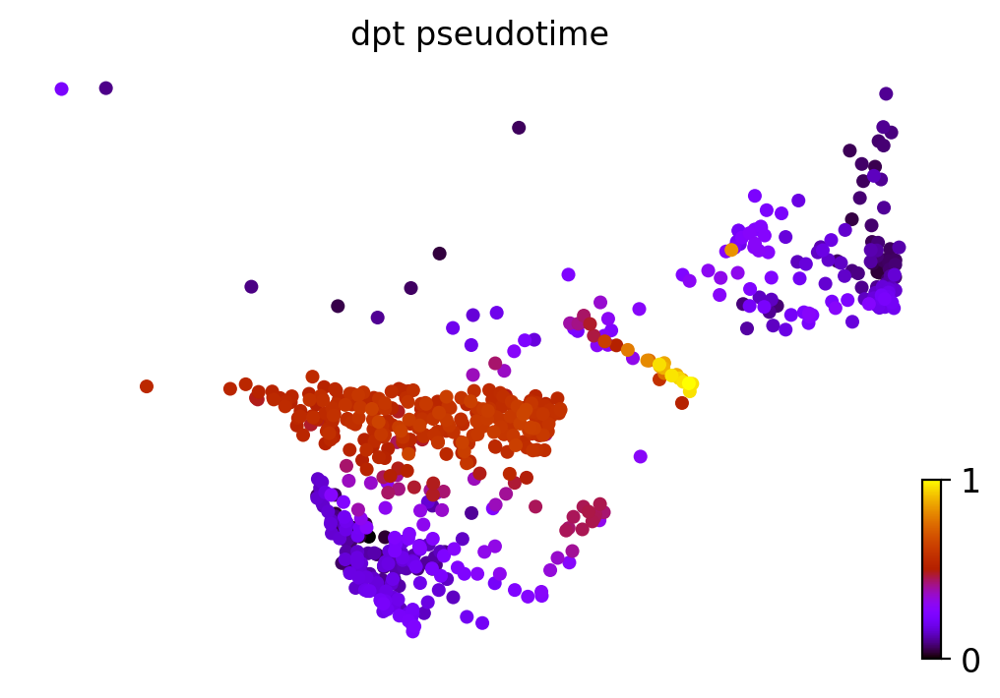

  0%|          | 0/12000 [00:00<?, ?it/s]

 | 1,142,8220

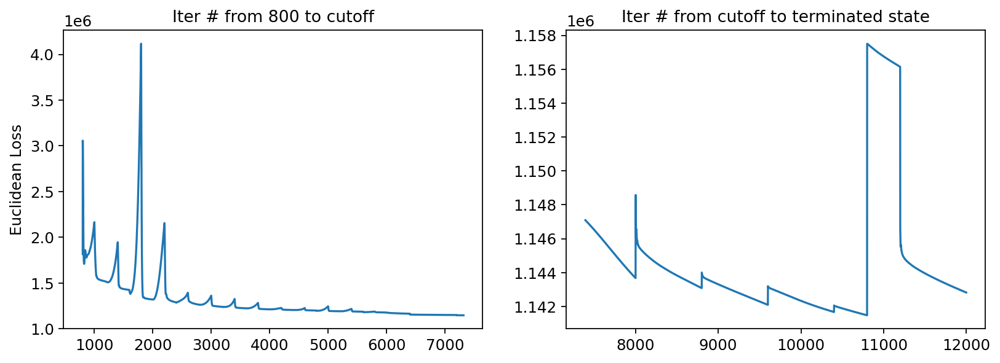

Total loss 1141476, vgene loss 1142822


  0%|          | 0/651 [00:00<?, ?cells/s]

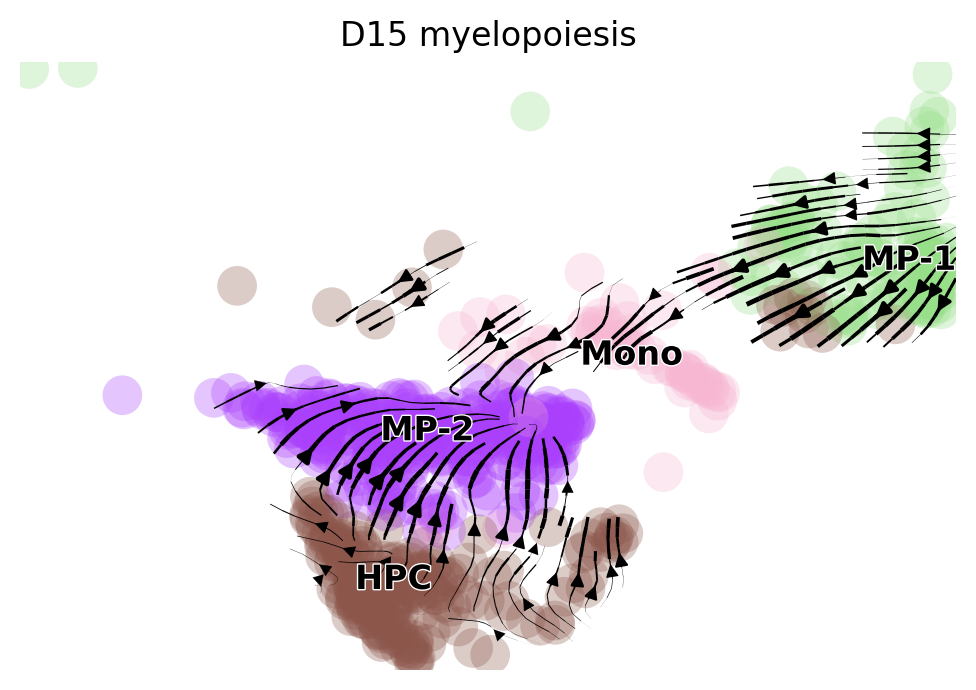

In [44]:
adata_emb_spl = utv.run_model(adata_emb_spl, 'celltype', config_file=velo_config)
scv.pl.velocity_embedding_stream(adata_emb_spl, color='celltype', dpi=100, title='D15 myelopoiesis')

# Public dataset and Correlation analysis 
squidpy env

In [3]:
adata_YS = sc.read('/home/yiming/vio_analysis/sc/public_YS_anno.h5ad')

In [4]:
adata_HEMO = sc.read('/home/yiming/vio_analysis/revision/res17_adata_anno_2.h5ad')

In [5]:
adata_YS.obs['sample'] = 'YS'
adata_HEMO.obs['sample'] = 'HEMO'

In [14]:
adata_merge = adata_YS.concatenate(adata_HEMO, index_unique=None)
adata_merge.obs_names_make_unique

/home/yiming/.conda/envs/squidpy/lib/python3.10/site-packages/anndata/_core/merge.py:942: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/home/yiming/.conda/envs/squidpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


<bound method AnnData.obs_names_make_unique of AnnData object with n_obs × n_vars = 33178 × 19859
    obs: 'clusters', 'celltype', 'sample', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'DF.classifications', 'seurat_clusters', 'RNA_snn_res.1.7', 'batch'
    var: 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'features-1'
    obsm: 'X_umap'>

In [15]:
sc.pp.normalize_total(adata_merge)
sc.pp.log1p(adata_merge)
sc.pp.highly_variable_genes(adata_merge, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pp.pca(adata_merge)
sc.pp.neighbors(adata_merge)
sc.tl.umap(adata_merge)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:26)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:33)


In [16]:
sc.external.pp.bbknn(adata_merge, batch_key='batch')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [17]:
adata_merge.obs['sample_cell'] = adata_merge.obs[['sample', 'celltype']].agg('_'.join, axis=1)
adata_merge.obs['sample_cell'] = adata_merge.obs['sample_cell'].astype('category')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample_cell']`


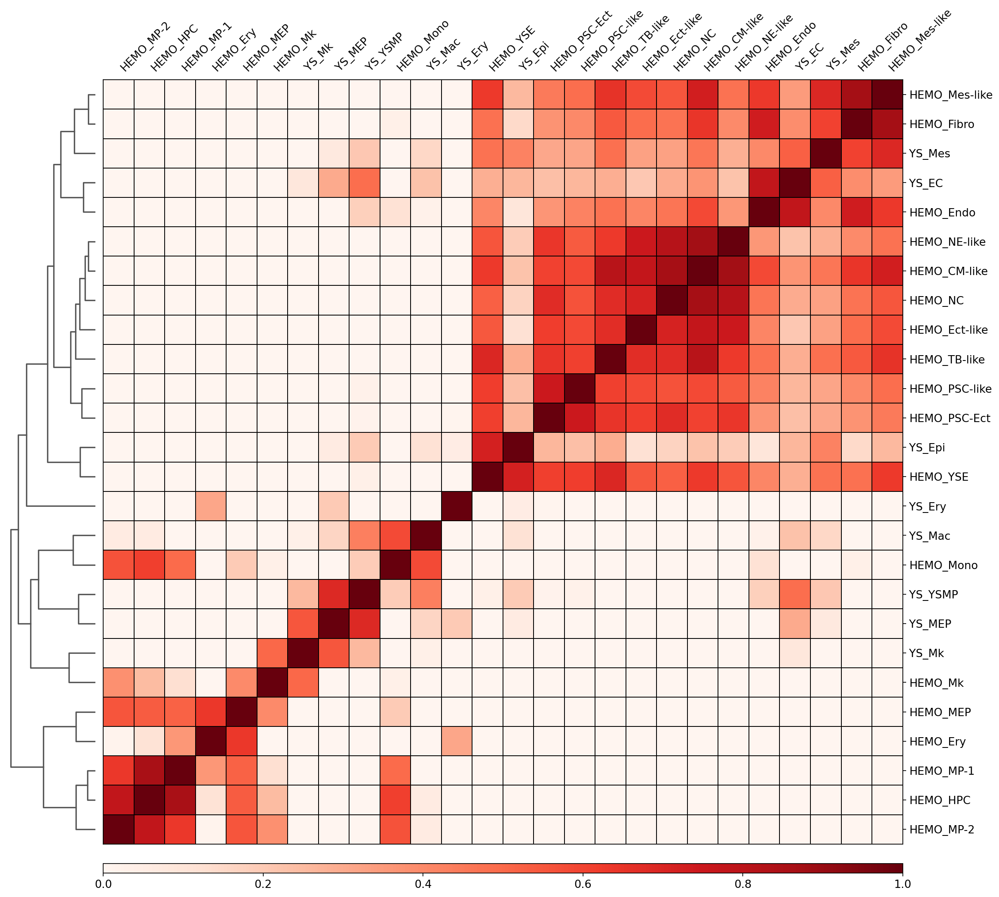

In [11]:
sc.pl.correlation_matrix(adata_merge, groupby='sample_cell', vmin=0, cmap='Reds')

In [18]:
adata_subset = adata_merge[adata_merge.obs['celltype'].isin(['YSE', 'Epi', 'Mk', 'Ery', 'MEP', 'Mono', 'Mac', 'Endo', 'EC'])]

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample_cell']`


/home/yiming/.conda/envs/squidpy/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/yiming/.conda/envs/squidpy/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


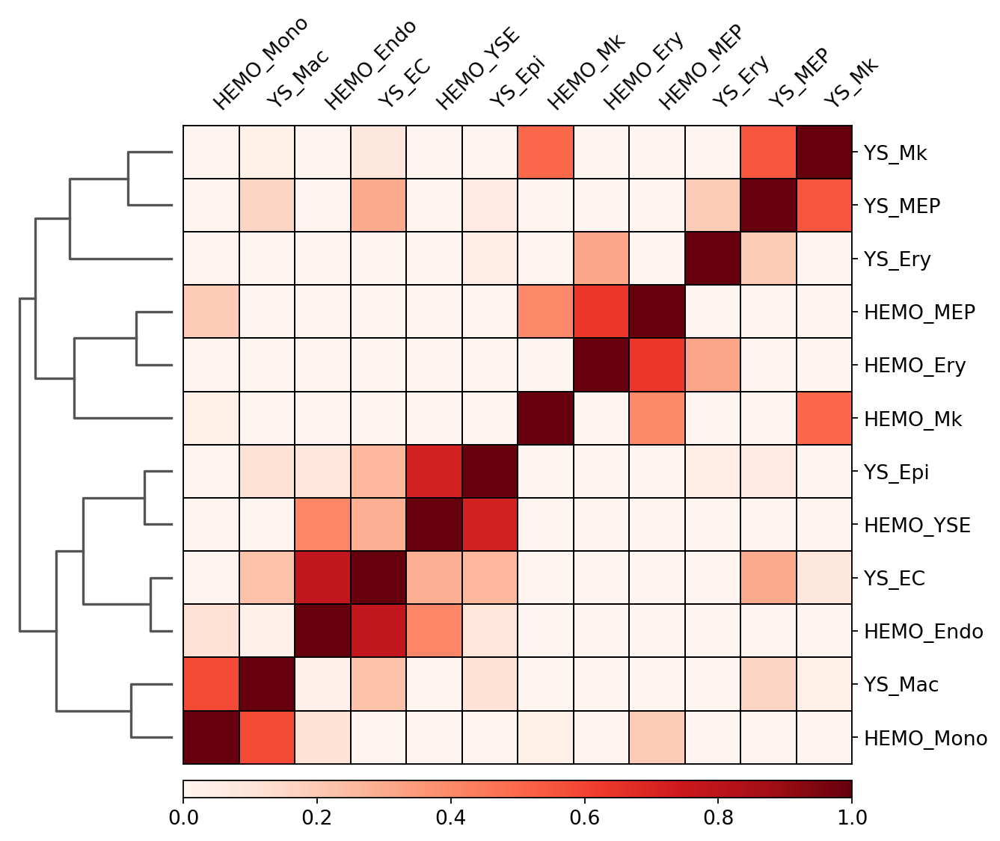

In [19]:
sc.pl.correlation_matrix(adata_subset, groupby='sample_cell', vmin=0, cmap='Reds')

## from seurat integration (YS_2021)

In [6]:
adata_int = sc.read_h5ad('/home/yiming/vio_analysis/revision/ys_integrate.h5ad')

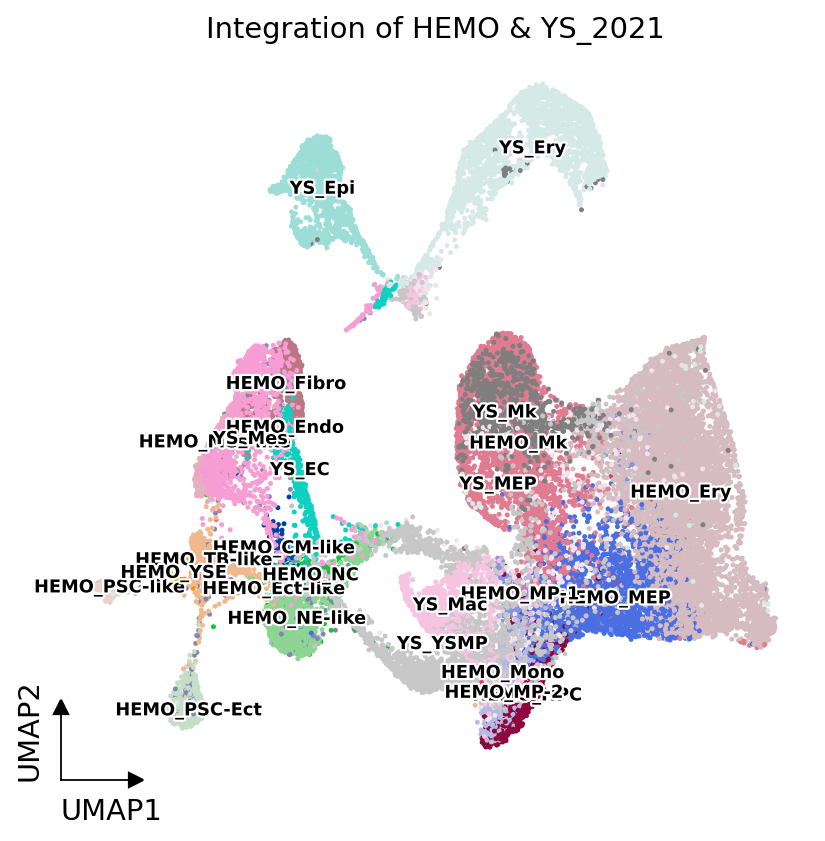

In [11]:
fig, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(adata_int, color=['celltype'], legend_loc="on data", legend_fontsize=8, size=20, ax=ax, show=False, 
           legend_fontoutline=2, title = 'Integration of HEMO & YS_2021')

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

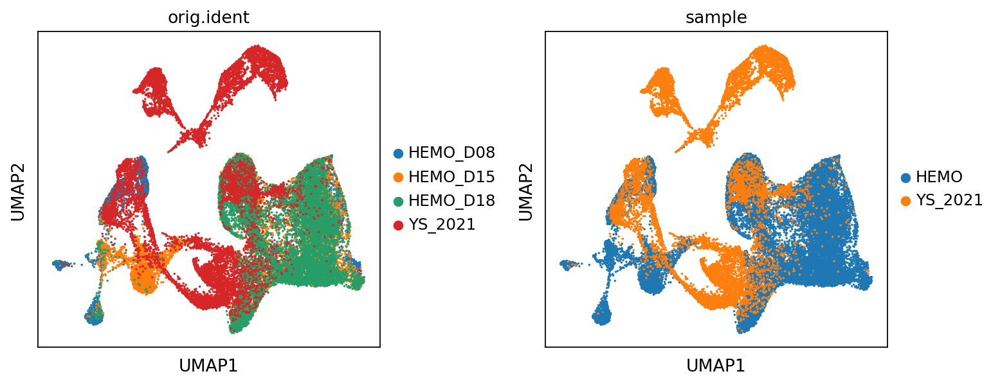

In [5]:
sc.pl.umap(adata_int, color=['orig.ident', 'sample'], 
           s=10, wspace=0.35)

In [6]:
adata_int.obs['highlight'] = adata_int.obs['celltype'].map({'YS_Ery': 'YS_Ery', 'HEMO_Ery': 'HEMO_Ery'})
adata_int.obs[['highlight']] = adata_int.obs[['highlight']].replace({np.nan: None}) 

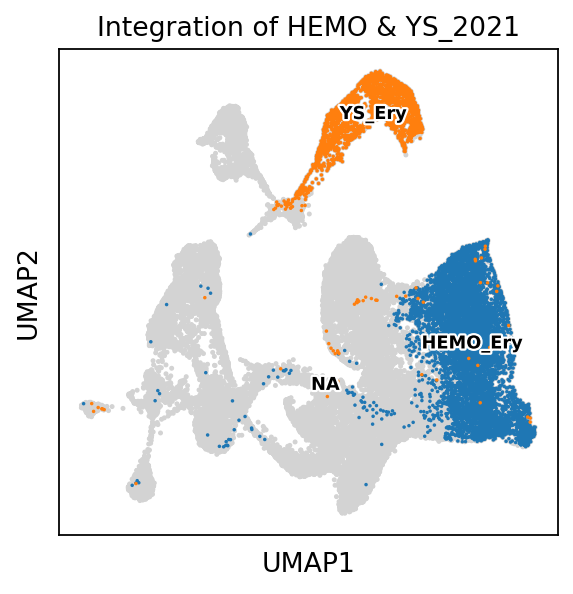

In [7]:
ax = sc.pl.umap(adata_int, s=20, show=False)
sc.pl.umap(adata_int, color=['highlight'], legend_loc='on data', legend_fontsize=8, legend_fontoutline=2, s=10, ax=ax, 
          title=['Integration of HEMO & YS_2021'])

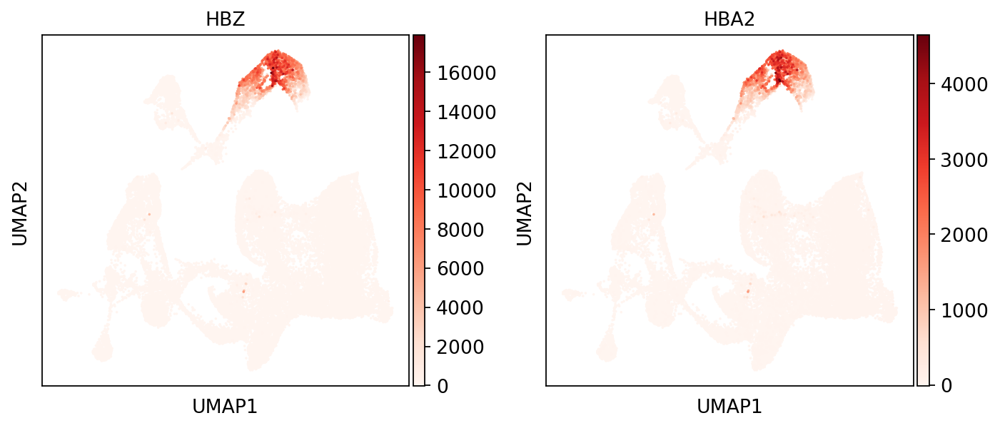

In [8]:
sc.pl.umap(adata_int, color=['HBZ', 'HBA2'], cmap='Reds', s=10, wspace=0.25)

## from seurat integration (HSC_2022)

In [12]:
adata_int = sc.read_h5ad('/home/yiming/vio_analysis/revision/hsc_integrate.h5ad')

/home/yiming/.conda/envs/scanpy/lib/python3.10/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [33]:
adata_int.obs[['celltype']] = adata_int.obs[['celltype']].replace({'NA': 'HSC_2022 sample'})

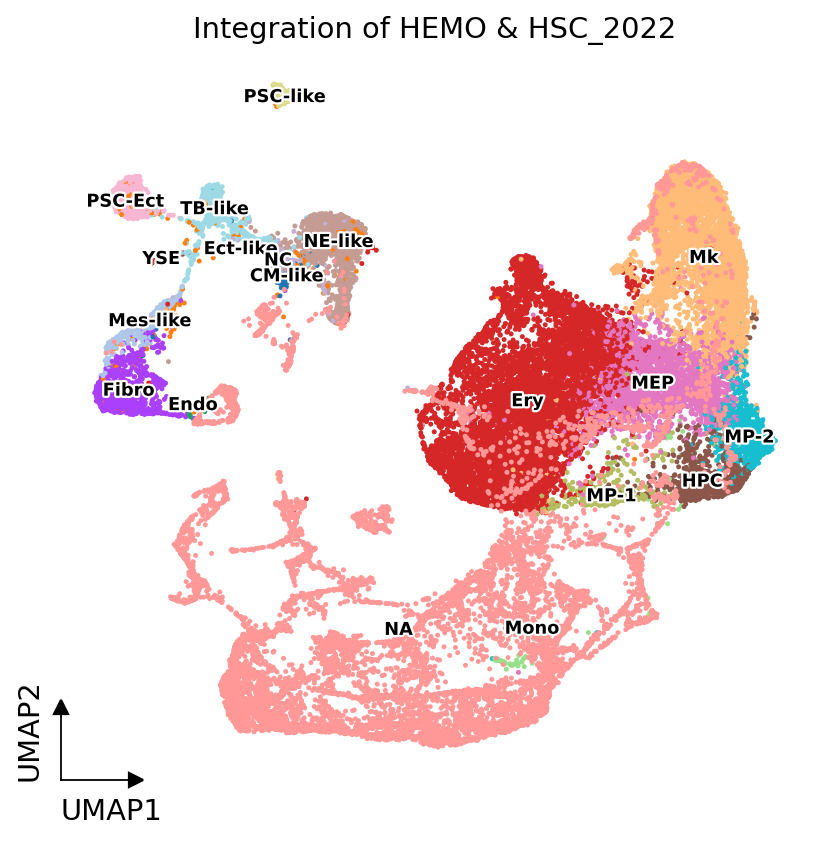

In [13]:
fig, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(adata_int, color=['celltype'], legend_loc="on data", legend_fontsize=8, size=20, ax=ax, show=False, 
           legend_fontoutline=2, title = 'Integration of HEMO & HSC_2022')

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

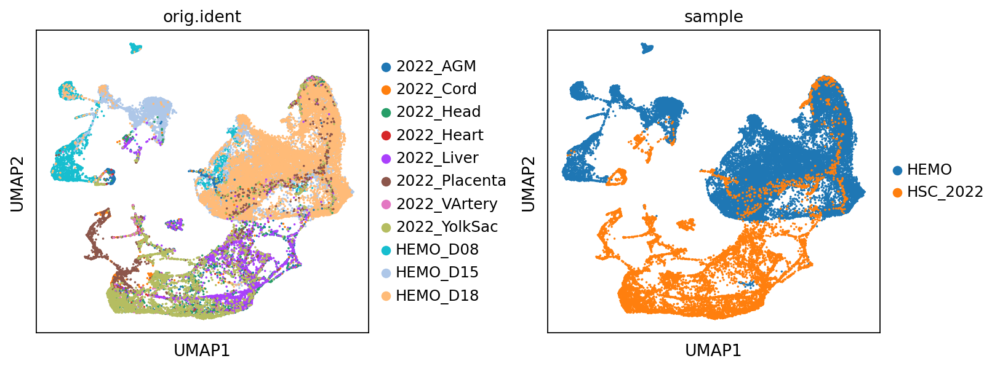

In [41]:
sc.pl.umap(adata_int, color=['orig.ident', 'sample'], 
           s=10, wspace=0.4)

# D04 sample

In [ ]:
adata = sc.read_h5ad('/home/yiming/vio_analysis/revision/d04_res12.h5ad')

In [ ]:
adata.obs[['celltype']] = adata.obs[['celltype']].replace({0: 'CM-like', 1: 'Mes-like', 2: 'Fibro', 
                                                          3: 'Endo', 4: 'PSC-Ect', 5: 'TB-like', 
                                                          6: 'YSE', 7: 'EryP'})

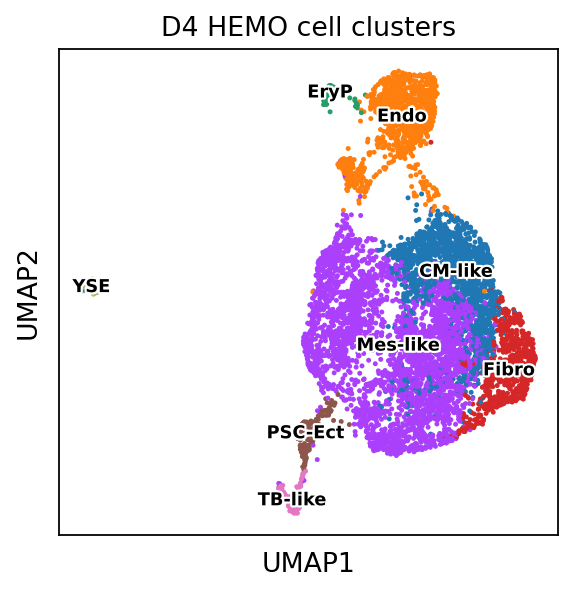

In [54]:
sc.pl.umap(adata, color=['celltype'], 
           legend_loc='on data', legend_fontsize=8, legend_fontoutline=2, s=20, 
           title='D4 HEMO cell clusters'
         )

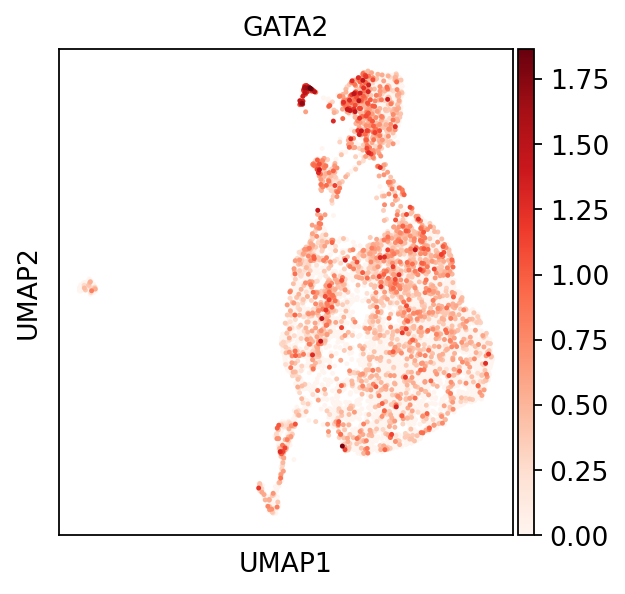

In [51]:
sc.pl.umap(adata, color=['GATA2'], s=20, cmap='Reds')

# YS sample

In [10]:
adata_YS = sc.read('/home/yiming/vio_analysis/sc/public_YS_anno.h5ad')

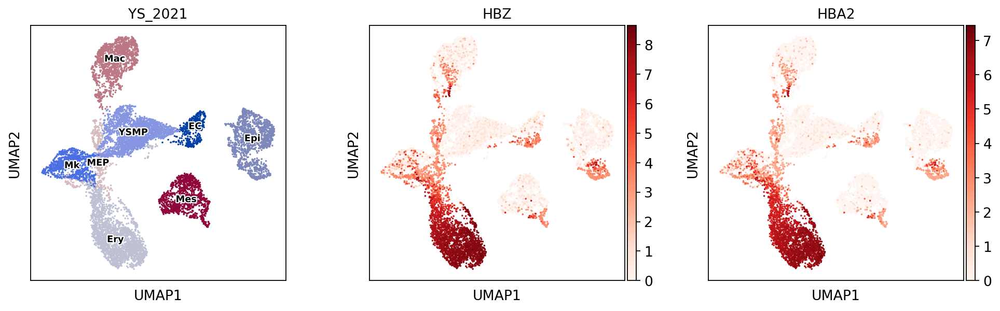

In [11]:
sc.pl.umap(adata_YS, color=['celltype', 'HBZ', 'HBA2'], 
           legend_loc='on data', legend_fontsize=8, legend_fontoutline=2, s=10, 
           cmap='Reds', title='YS_2021')

In [15]:
adata_subset = adata_YS[adata_YS.obs['celltype'].isin(['Ery', 'Mk', 'MEP', 'YSMP', 'Mac', 'Epi', 'EC'])]

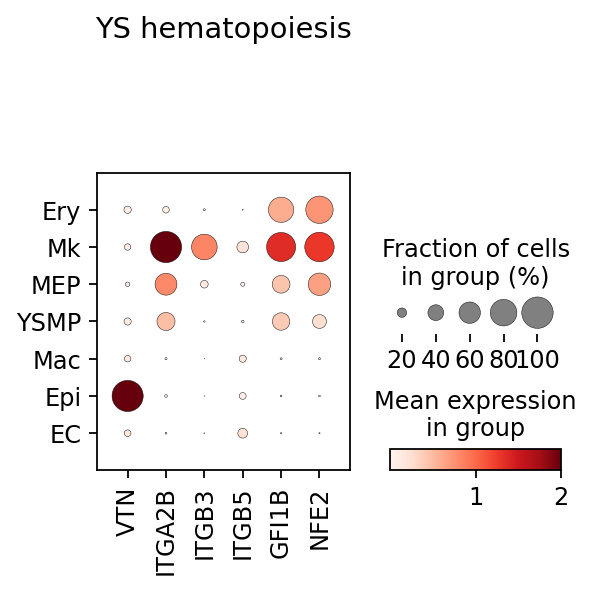

In [19]:
sc.pl.dotplot(adata_subset, var_names=['VTN', 'ITGA2B', 'ITGB3', 'ITGB5', 'GFI1B', 'NFE2'],  
              categories_order=['Ery', 'Mk', 'MEP', 'YSMP', 'Mac', 'Epi', 'EC'], 
              groupby=['celltype'], title='YS hematopoiesis', vmax=2)

# Load spatial data

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
# sc.logging.print_versions()
sc.settings.set_figure_params(dpi=140, fontsize=8, facecolor='white')
sc.settings.verbosity = 3
plt.style.use('seaborn-white')

## fragment LR mapping
squidpy env

In [4]:
import scanpy as sc
import anndata as ad
import squidpy as sq
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 

In [3]:
adata = sc.read_h5ad('spatial_slice4.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 3997 × 2235
    obs: 'x', 'y', 'spot_index', 'cell_index', 'cell_nums', 'discrete_label', 'discrete_label_ct', 'frag'
    uns: 'discrete_label_ct_colors', 'spatial'
    obsm: 'spatial'

In [7]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2160)

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [8]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/yiming/.conda/envs/scanpy/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)
running Leiden clustering
    finished: found 39 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


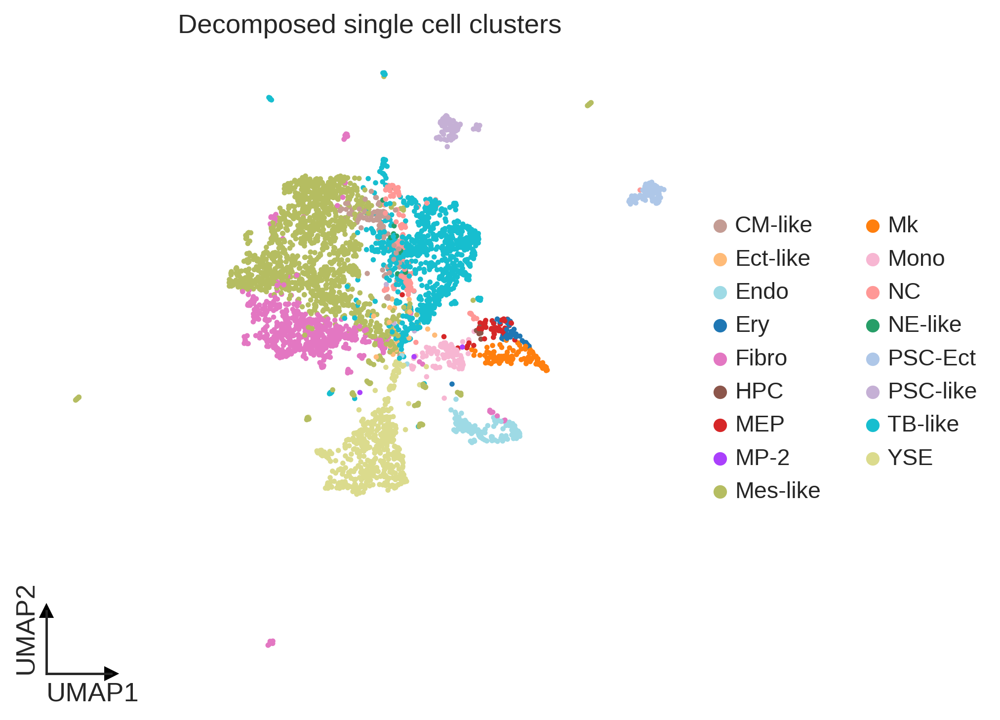

In [9]:
fig, ax = plt.subplots(figsize=(6, 6))
sc.pl.umap(adata, color=['discrete_label_ct'], show=False, ax=ax, legend_fontsize=12, title='Decomposed single cell clusters')

shrink_by = 0.1
xlim = ax.get_xlim()
ylim = ax.get_ylim()

xbound = xlim[0] + (xlim[1] - xlim[0]) * shrink_by
ybound = ylim[0] + (ylim[1] - ylim[0]) * shrink_by

b = ax.spines["bottom"]
b.set_bounds(xlim[0], xbound)
ax.set_xlabel(ax.get_xlabel(), x=0, ha="left")
ax.plot(xbound, 0, ">k", transform=ax.get_xaxis_transform(), clip_on=False)

b = ax.spines["left"]
b.set_bounds(ylim[0], ybound)
ax.set_ylabel(ax.get_ylabel(), y=0, ha="left")
ax.plot(0, ybound, "^k", transform=ax.get_yaxis_transform(), clip_on=False)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

In [6]:
adata_frag1 = adata[adata.obs.query('frag == 1').index]

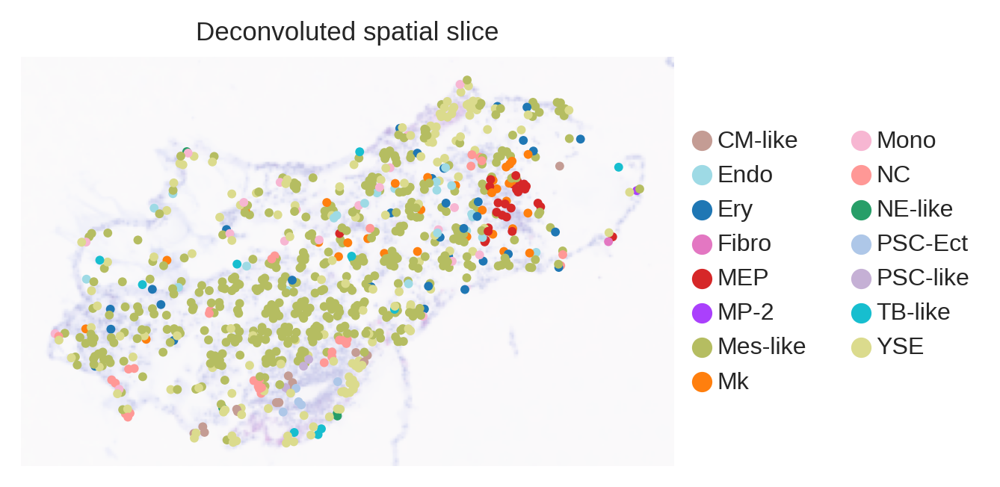

In [7]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.spatial(adata_frag1, color=['discrete_label_ct'], spot_size=35, img_key='hires', alpha_img=0.5, 
              ax=ax, frameon=False, title=['Deconvoluted spatial slice'])

In [7]:
adata = adata_frag1[adata_frag1.obs['discrete_label_ct'].isin(['Ery', 'Mk', 'MEP', 'YSE'])]

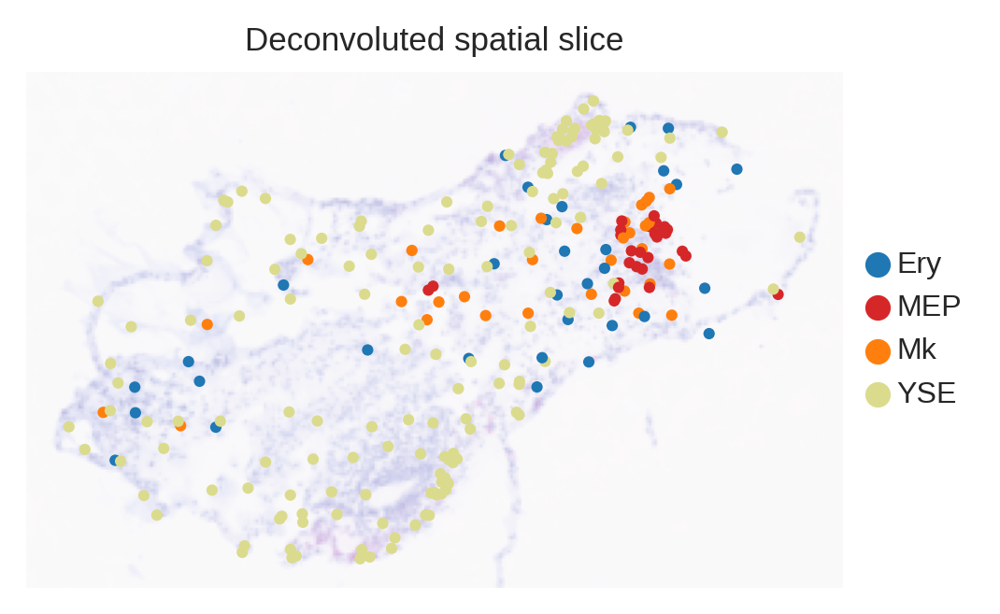

In [11]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.spatial(adata, color=['discrete_label_ct'], spot_size=35, img_key='hires', alpha_img=0.5, 
              ax=ax, frameon=False, title=['Deconvoluted spatial slice'])

In [ ]:
sc.pl.spatial(adata_frag1, color=['VTN', 'ITGA2B'], spot_size=40, img_key='hires', alpha_img=0.5, 
              frameon=False, cmap='Reds', ncols=1)

In [5]:
adata_subset = adata[adata.obs['discrete_label_ct'].isin(['Ery', 'Mk', 'MEP', 'MP-1', 'MP-2', 'Mono', 'Endo', 'YSE'])]

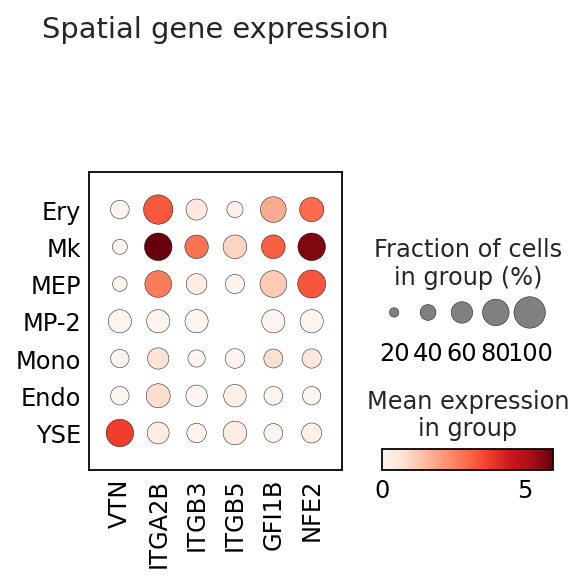

In [16]:
sc.pl.dotplot(adata_subset, var_names=['VTN', 'ITGA2B', 'ITGB3', 'ITGB5', 'GFI1B', 'NFE2'], 
              categories_order=['Ery', 'Mk', 'MEP', 'MP-2', 'Mono', 'Endo', 'YSE'],
              groupby=['discrete_label_ct'], title='Spatial gene expression', vmax=6)

Found `126` significant interactions at level `0.001`


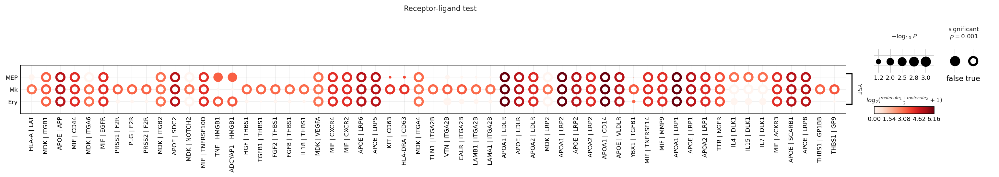

In [18]:
sq.pl.ligrec(adata, cluster_key="discrete_label_ct", source_groups=['YSE'], target_groups=['MEP', 'Mk', 'Ery'],
             means_range=(6.5, np.inf), alpha=0.001, dendrogram='both', cmap='Reds',
             remove_nonsig_interactions = True, 
            swap_axes=True,
            )

In [27]:
df_means = adata.uns['discrete_label_ct_ligrec']['means']
df_pvalues = adata.uns['discrete_label_ct_ligrec']['pvalues']
df_metadata = adata.uns['discrete_label_ct_ligrec']['metadata']

In [31]:
df_means.to_csv('df_means.csv')
df_pvalues.to_csv('df_pvalues.csv')
df_metadata.to_csv('df_metadata.csv')

In [15]:
# extract df
means_sou_tar = adata.uns['discrete_label_ct_ligrec']['means']['YSE'].copy().reset_index()[['source','target','Mk']]

df_vtn = means_sou_tar.query("`source` == 'VTN'")
df_vtn_value = df_vtn.query("`Mk` >= 1") 
df_vtn_value.sort_values('Mk', axis=0, ascending=False,inplace=True)

df_vtn_value = pd.DataFrame(df_vtn_value.values, columns=['source','target','Mk'] )

In [16]:
lrdf = adata.uns['discrete_label_ct_ligrec']['metadata'].reset_index(level=[0,1]).copy()
df_vtn_pair = lrdf.query("`source` == 'VTN'")

df_vtn_sort = pd.merge(df_vtn_value, df_vtn_pair[['target', 'is_stimulation']], on='target', how='inner')

In [17]:
df_vtn_sort['condition_value'] = df_vtn_sort.apply(lambda x: x['Mk'] if x['is_stimulation']!=False else x['Mk']*-1, axis=1)

In [18]:
df_vtn_sort['pair'] = df_vtn_sort['source'] + '_' + df_vtn_sort['target']

In [19]:
df_vtn_result = df_vtn_sort[['pair', 'condition_value']].set_index('pair')
df_vtn_result = df_vtn_result.sort_values(by='condition_value', ascending=True).copy()

In [20]:
df_vtn_result.shape

(32, 1)

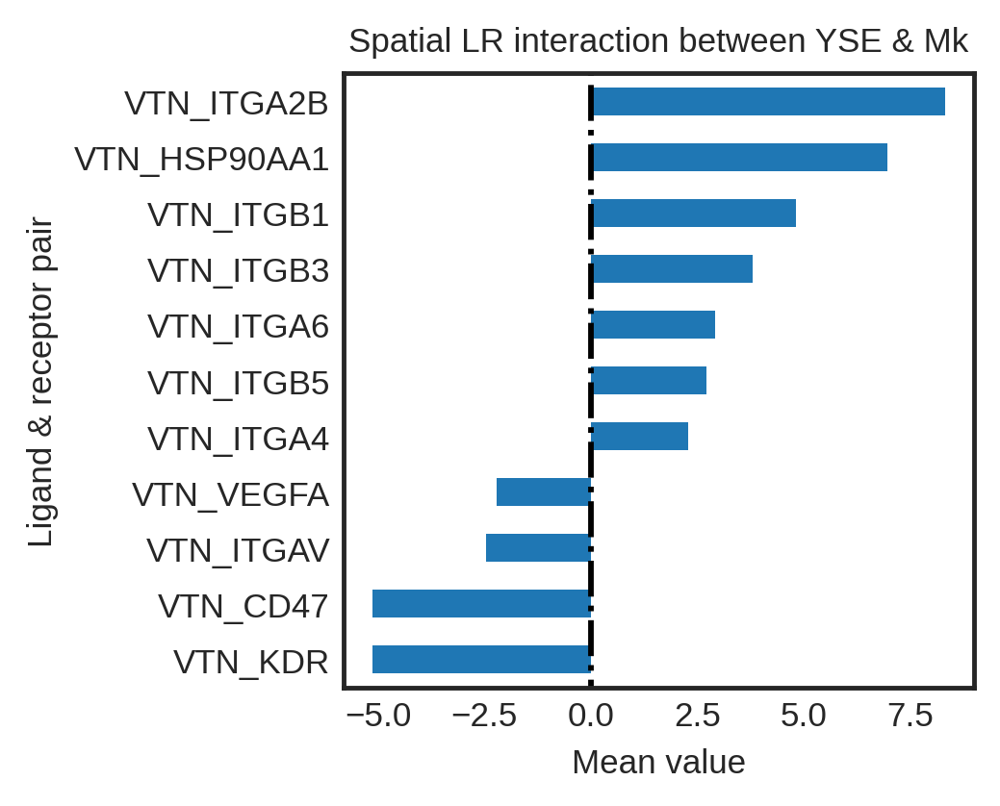

In [122]:
# 2.2
df_vtn_result.plot.barh(legend=False)
plt.style.use('seaborn-white')
plt.rcParams["figure.figsize"] = (3, 3)
plt.ylabel('Ligand & receptor pair')
plt.xlabel('Mean value')
plt.title('Spatial LR interaction between YSE & Mk')
plt.vlines(0, -1, 35, colors='black', linestyles='-.')
plt.show()

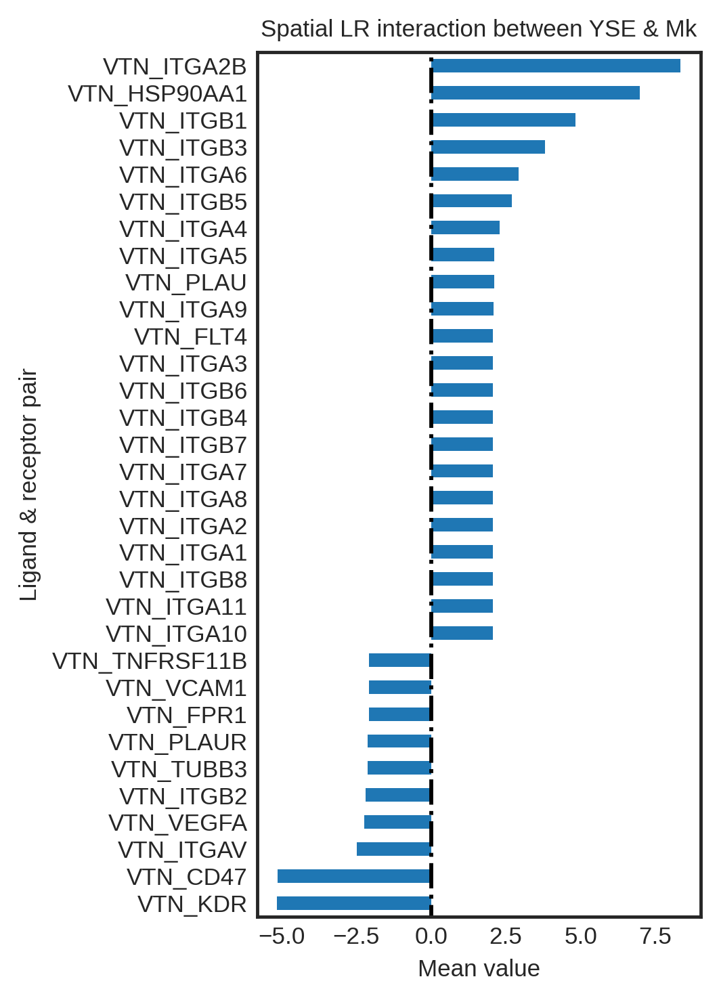

In [24]:
# 1.0
df_vtn_result.plot.barh(legend=False)
plt.style.use('seaborn-white')
plt.rcParams["figure.figsize"] = (3, 6)
plt.ylabel('Ligand & receptor pair')
plt.xlabel('Mean value')
plt.title('Spatial LR interaction between YSE & Mk')
plt.vlines(0, -1, 35, colors='black', linestyles='-.')
plt.show()

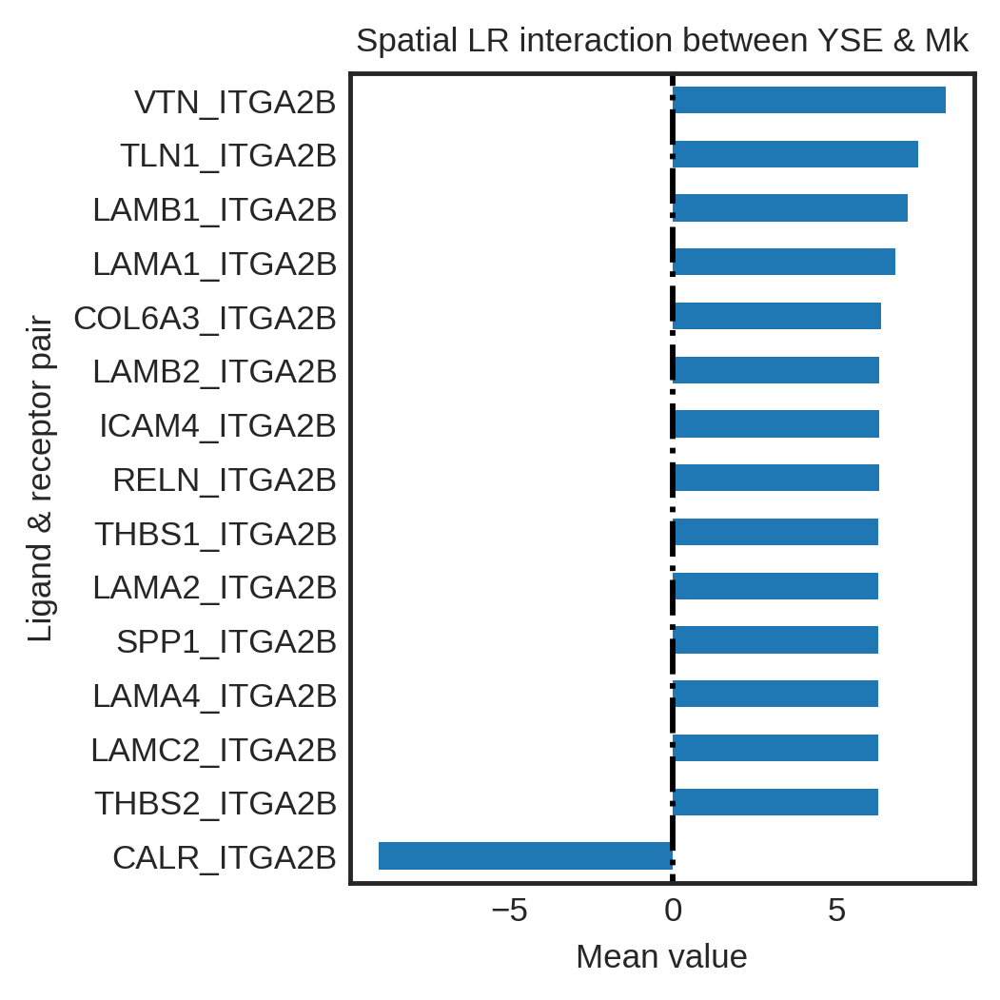

In [76]:
# 1.0
df_itga2b_result.plot.barh(legend=False)
plt.style.use('seaborn-white')
plt.rcParams["figure.figsize"] = (3, 4)
plt.ylabel('Ligand & receptor pair')
plt.xlabel('Mean value')
plt.title('Spatial LR interaction between YSE & Mk')
plt.vlines(0, -1, 35, colors='black', linestyles='-.')
plt.show()

## cell proportion

In [3]:
adata = sc.read_h5ad('spatial_slice4.h5ad')

In [4]:
# set cell counts
adata.obs['count'] = 1

# calculate the cell counts by different fragments
celltype_prop = pd.pivot_table(adata.obs, values='count', index='frag', columns='discrete_label_ct', aggfunc='sum')

# calculate the cell percentatge
celltype_perc = celltype_prop.divide(celltype_prop.sum(axis=1), axis=0)

In [5]:
def get_colors_by_cells(cell_list):
    return [cmap_dict[cell] for cell in cell_list]

# color from single-cell
cell_type = list(['Ery', 'Mk', 'NE-like', 'MEP', 'MP-2', 'HPC', 'Fibro', 'Mes-like', 'TB-like', 
                  'PSC-Ect', 'Ect-like', 'MP-1', 'NC', 'PSC-like', 'CM-like', 'Mono', 'YSE', 'Endo'])
my_colors = list(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf',
                  '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5'])
cmap_dict = dict(zip(cell_type, my_colors))

In [6]:
# apply same color from single-cell
color = get_colors_by_cells(np.array(celltype_prop.T.index))

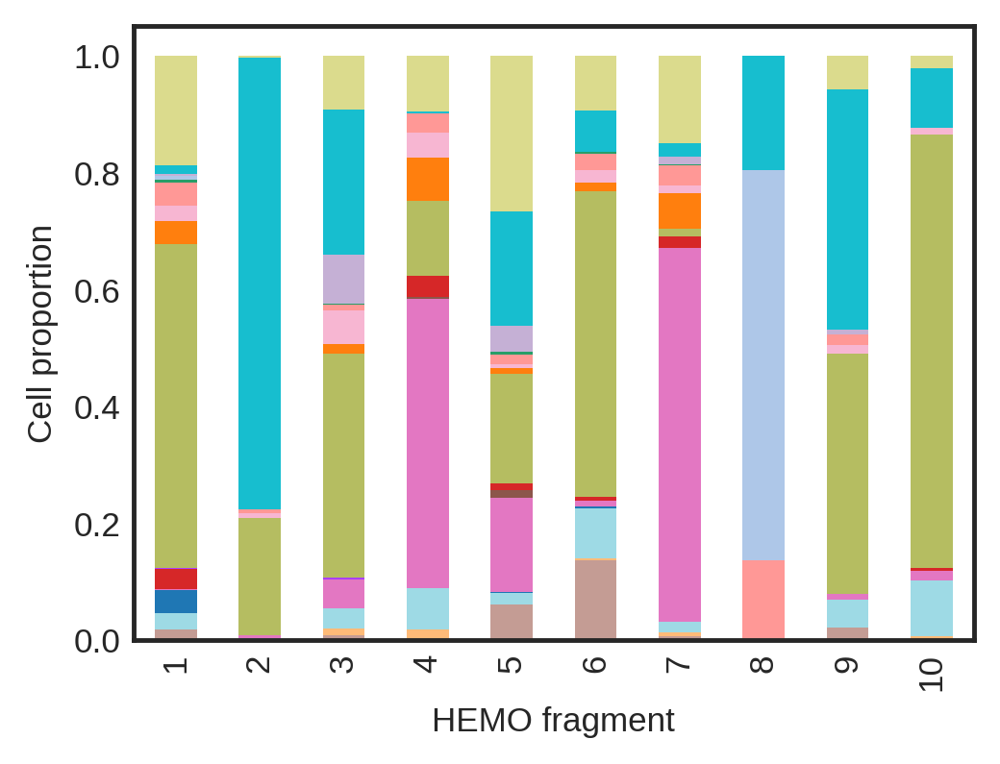

In [10]:
plt.rcParams["figure.figsize"] = (4, 3)
plt.rcParams["figure.dpi"] = 140
celltype_perc.plot.bar(stacked=True, legend=False, color=color)
# plt.legend(loc=(1.04, 0), fontsize='x-small')
plt.xlabel('HEMO fragment')
plt.ylabel('Cell proportion')
plt.show()

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import skbio

In [34]:
# set cell counts
adata.obs['count'] = 1

# calculate the cell counts by different fragments
celltype_prop = pd.pivot_table(adata.obs, values='count', index='frag', columns='discrete_label_ct', aggfunc='sum')
# celltype_prop = celltype_prop.drop('0', axis=0)
celltype_prop = celltype_prop.fillna(0)

# calculate the cell percentatge
celltype_perc = celltype_prop.divide(celltype_prop.sum(axis=1), axis=0)

In [35]:
celltype_prop

discrete_label_ct,CM-like,Ect-like,Endo,Ery,Fibro,HPC,MEP,MP-2,Mes-like,Mk,Mono,NC,NE-like,PSC-Ect,PSC-like,TB-like,YSE
frag,,,,,,,,,,,,,,,,,
1,14.0,0.0,22.0,32.0,1.0,0.0,28.0,1.0,441.0,32.0,20.0,32.0,4.0,5.0,3.0,11.0,150.0
2,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,69.0,0.0,3.0,2.0,0.0,0.0,0.0,267.0,1.0
3,5.0,8.0,24.0,0.0,34.0,0.0,0.0,2.0,265.0,11.0,39.0,7.0,2.0,0.0,57.0,171.0,64.0
4,0.0,5.0,20.0,0.0,139.0,1.0,10.0,0.0,36.0,21.0,12.0,9.0,0.0,0.0,0.0,1.0,27.0
5,22.0,0.0,7.0,1.0,58.0,5.0,4.0,0.0,68.0,4.0,2.0,6.0,2.0,0.0,16.0,71.0,97.0
6,39.0,1.0,24.0,1.0,3.0,0.0,2.0,0.0,149.0,4.0,6.0,8.0,1.0,0.0,0.0,20.0,27.0
7,3.0,4.0,10.0,0.0,348.0,0.0,11.0,0.0,7.0,33.0,7.0,19.0,1.0,0.0,7.0,12.0,82.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,0.0,78.0,0.0,23.0,0.0
9,8.0,0.0,17.0,0.0,4.0,0.0,0.0,0.0,150.0,0.0,5.0,7.0,0.0,0.0,3.0,150.0,21.0


In [36]:
sd_list = []
for i in range(10):
    sd_list.append(skbio.diversity.alpha.shannon(celltype_prop.values[i]))

In [37]:
celltype_prop.columns = celltype_prop.columns.add_categories(['sd']) # solve the CategoricalIndex issue
celltype_prop['sd'] = sd_list
celltype_prop

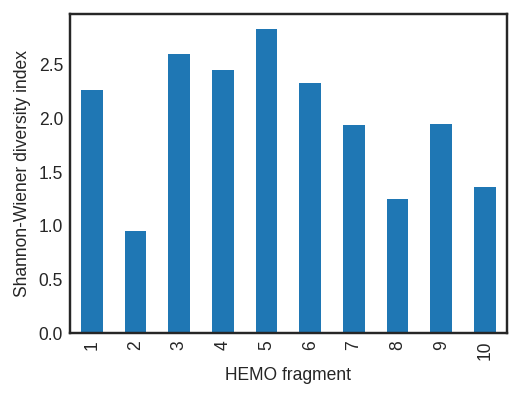

In [45]:
plt.rcParams["figure.figsize"] = (4, 3)
plt.rcParams["figure.dpi"] = 140
celltype_prop['sd'].plot.bar(stacked=True, legend=False)
plt.xlabel('HEMO fragment')
plt.ylabel('Shannon-Wiener diversity index')
plt.show()

## spatial validation

In [19]:
adata_subset = adata[adata.obs['celltype'].isin(['Ery', 'Mk', 'MEP', 'MP-2', 'Mono', 'Endo', 'YSE'])]

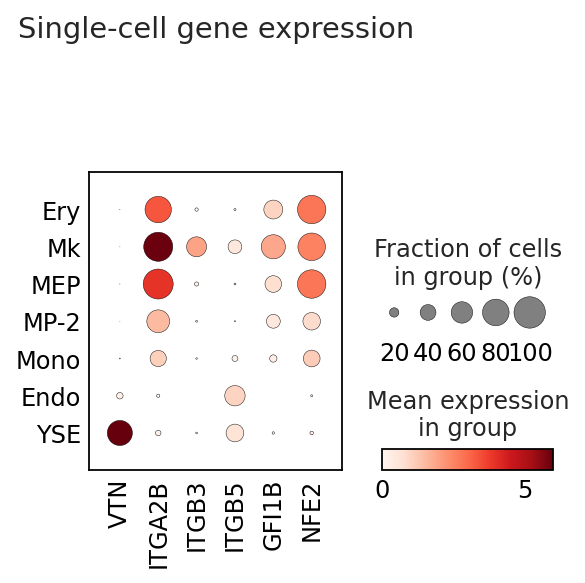

In [11]:
sc.pl.dotplot(adata_subset, var_names=['VTN', 'ITGA2B', 'ITGB3', 'ITGB5', 'GFI1B', 'NFE2'], 
              categories_order=['Ery', 'Mk', 'MEP', 'MP-2', 'Mono', 'Endo', 'YSE'],
              groupby=['celltype'], title='Single-cell gene expression', vmax=6)

## cell number quantification

In [5]:
cell_number4 = pd.pivot_table(adata.uns['cell_locations'][['spot_index', 'cell_nums']], columns='spot_index', aggfunc='max').T

In [7]:
cell_number3 = pd.pivot_table(adata.uns['cell_locations'][['spot_index', 'cell_nums']], columns='spot_index', aggfunc='max').T

In [9]:
cell_number2 = pd.pivot_table(adata.uns['cell_locations'][['spot_index', 'cell_nums']], columns='spot_index', aggfunc='max').T

In [11]:
cell_number1 = pd.pivot_table(adata.uns['cell_locations'][['spot_index', 'cell_nums']], columns='spot_index', aggfunc='max').T

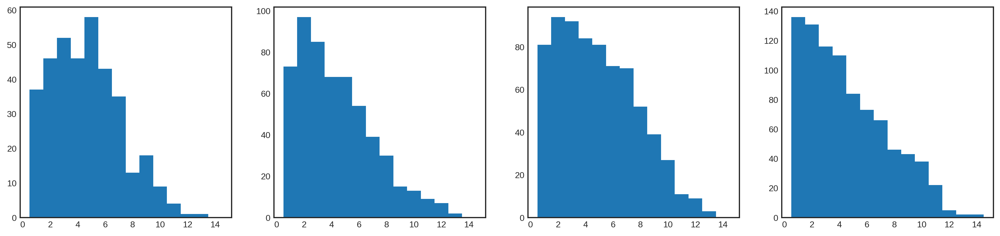

In [14]:
fig, axs = plt.subplots(1, 4, figsize=(18,4))
axs = axs.flatten()
for i, df in enumerate([cell_number1, cell_number2, cell_number3, cell_number4]): 
    axs[i].hist(df['cell_nums'], bins=np.arange(1, 16)-0.5)
    

# Plotting spatial with RCTD

save results from R
- df_norm_wei <- as.data.frame(norm_weights)
- write.csv(df_norm_wei, 'slice4_norm_wei.csv') 

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import colors
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors

In [2]:
# sc.logging.print_versions()
sc.settings.set_figure_params(dpi=140, facecolor='white')
sc.settings.verbosity = 3

In [3]:
# load raw count matrix of ST adata
adata = sc.read_visium("/usersdata/yiming/VIO/spaceranger_run/D1/outs", 
                       count_file="filtered_feature_bc_matrix.h5",
                       load_images="tissue_hires_image.png", 
                       source_image_path="/usersdata/yiming/VIO/spaceranger_run/D1/outs/spatial")

reading /usersdata/yiming/VIO/spaceranger_run/D1/outs/filtered_feature_bc_matrix.h5
 (0:00:01)


/home/yiming/.conda/envs/scanpy/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
# load RCTD results
cellprop = pd.read_csv('/home/yiming/vio_analysis/revision/seurat_fig/slice4_norm_wei.csv', index_col=0)
# reorder the columns
cellprop = cellprop.reindex(columns=sorted(cellprop.columns))

# take out the coordinate from raw adata
coord = pd.DataFrame(adata.obsm['spatial'], columns=['x', 'y'], index=adata.obs_names)

# join two df by index and rm redundent cells
merge = pd.DataFrame.join(cellprop, coord)
cellprop = pd.DataFrame.drop(merge, columns=['x', 'y'])
coord = merge[['x', 'y']]

In [5]:
# color from single-cell
cell_type = list(['Ery', 'Mk', 'NE-like', 'MEP', 'MP-2', 'HPC', 'Fibro', 'Mes-like', 'TB-like', 
                  'PSC-Ect', 'Ect-like', 'MP-1', 'NC', 'PSC-like', 'CM-like', 'Mono', 'YSE', 'Endo'])
my_colors = list(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf',
                  '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5'])

# make color map
cmap_dict = {}
for cell, color in zip(cell_type, my_colors):
    color_list = ["#E5E5E5", color]
    cmap_dict[cell] = colors.LinearSegmentedColormap.from_list(cell, color_list)

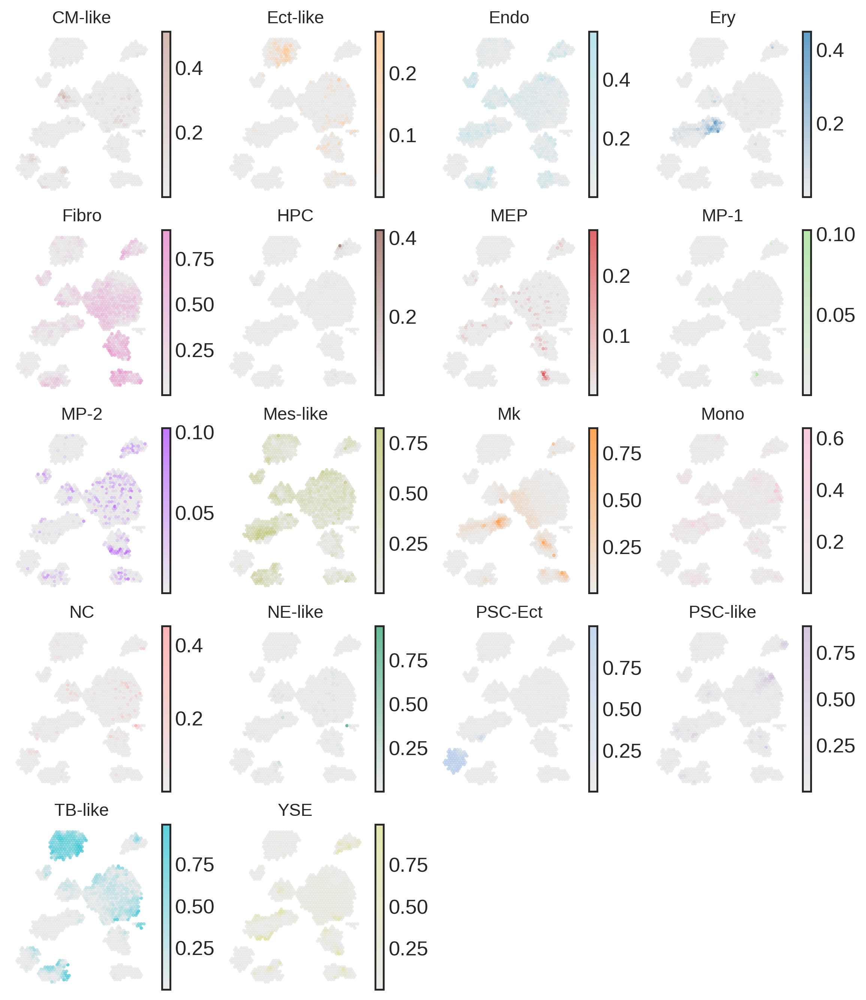

In [6]:
plt.style.use('seaborn-white')
plt.figure(figsize=(10, 12))
for i,c in enumerate(cellprop.columns):
    plt.subplot(5, 4, i+1)
    plt.scatter(coord.x, coord.y*(-1), 
            marker = 'o', c=cellprop[c], cmap=cmap_dict[c], alpha=0.7, linewidth=0, s=5)
    plt.axis('off')
    plt.colorbar()
    plt.title(c, fontsize=12)

In [7]:
# frag1
frag1 = coord.query('(5500<x<8200) & (4500<y<6200)')
# frag2
frag2 = coord.query('(6000<x<9000) & (800<y<2500)')
# frag3
frag3 = coord.query('(8000<x<10700) & (2500<y<5400)')
p12 = coord.query('(8000<x<8300) & (4500<y<5400) | (9500<x<10700) & (5200<y<5400)')
frag3 = pd.DataFrame.drop(frag3, index=p12.index)
# frag4
frag4 = coord.query('(9000<x<10700) & (7000<y<8000)')
# frag5
frag5 = coord.query('(9500<x<11000) & (0<y<2500)')
# frag6
frag6 = coord.query('(6800<x<8000) & (3000<y<4500)')
# frag7
frag7 = coord.query('(8900<x<10200) & (5300<y<6800)')
# frag8
frag8 = coord.query('(5000<x<6500) & (6200<y<7600)')
p3 = coord.query('(6000<x<6500) & (7200<y<7600)')
frag8 = pd.DataFrame.drop(frag8, index=p3.index)
# frag9
frag9 = coord.query('(6000<x<7800) & (6800<y<8100)')
p4 = coord.query('(6000<x<6200) & (6800<y<7200)')
frag9 = pd.DataFrame.drop(frag9, index=p4.index)
# frag10
frag10 = coord.query('(6000<x<7000) & (2500<y<3500)')

In [7]:
frag1 = coord.query('(5500<x<8200) & (4500<y<6200)')
df = pd.DataFrame.join(frag1, cellprop)
cellprop_frag1 = pd.DataFrame.drop(df, columns=['x', 'y'])

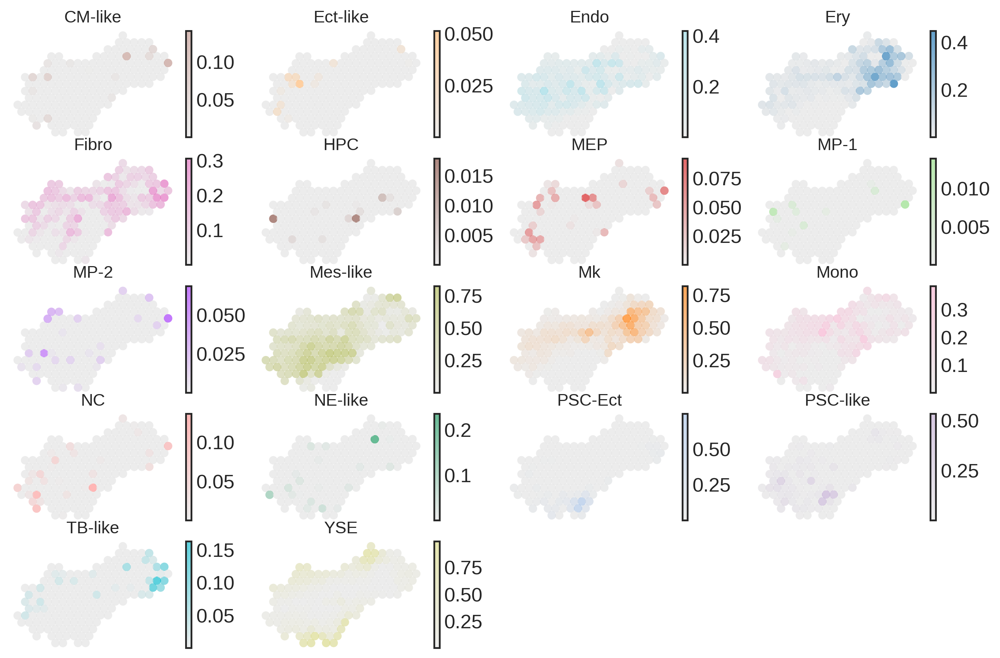

In [13]:
# frag1
plt.style.use('seaborn-white')
plt.figure(figsize=(12, 8))
for i,c in enumerate(cellprop_frag1.columns):
    plt.subplot(5, 4, i+1)
    plt.scatter(frag1.x, frag1.y*(-1), 
                marker = 'o', c=cellprop_frag1[c], cmap=cmap_dict[c], alpha=0.7, linewidth=0)
    plt.axis('off')
    plt.title(c, fontsize=12)
    plt.colorbar() 

In [15]:
# plot specific populations
df2 = cellprop_frag1[['Ery', 'Mk', 'MEP', 'YSE']]

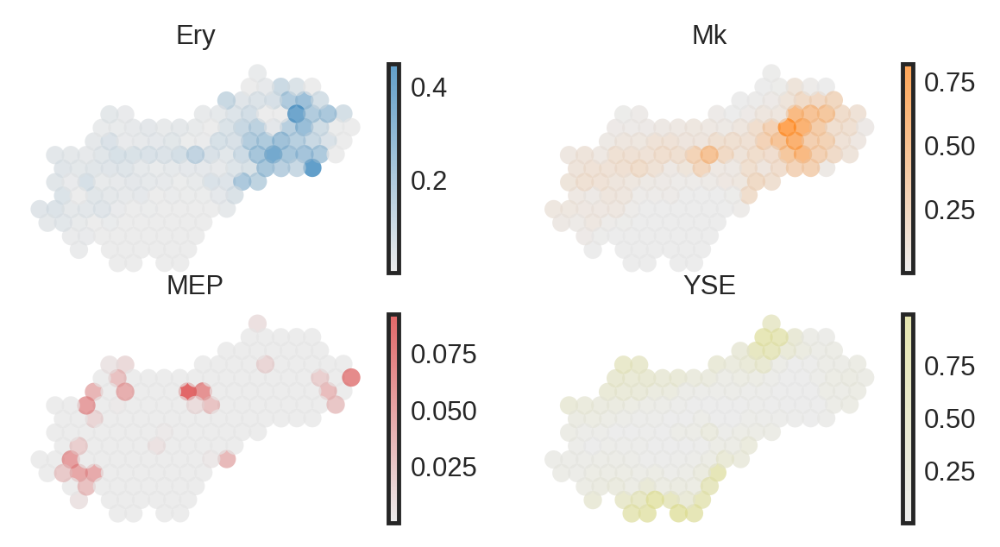

In [46]:
# frag1
plt.style.use('seaborn-white')
plt.figure(figsize=(5, 2.5))
for i,c in enumerate(df2.columns):
    plt.subplot(2, 2, i+1)
    plt.scatter(frag1.x, frag1.y*(-1), 
                marker = 'o', c=cellprop_frag1[c], cmap=cmap_dict[c], alpha=0.7, linewidth=0, s=30)
    plt.axis('off')
    plt.title(c, fontsize=8)
#     plt.colorbar() 
    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=8)